In [ ]:
from datetime import datetime
import numpy as np             #for numerical computations like log,exp,sqrt etc
import pandas as pd            #for reading & storing data, pre-processing
import matplotlib.pylab as plt #for visualization
import seaborn as sns
%matplotlib inline  
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARIMA
from matplotlib.pyplot import rcParams
from statsmodels.tsa.vector_ar.vecm import coint_johansen #Johansen Cointegration test
from sklearn.metrics import mean_squared_error

from IPython.display import display
pd.options.display.float_format = '{:,.2f}'.format
import warnings
warnings.filterwarnings("ignore")
# from matplotlib.pylab import rcParams
# rcParams['figure.figsize'] = 10, 6
from datetime import timedelta
runSarima=True


/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
store = pd.read_csv('store.csv')
train = pd.read_csv("train.csv",parse_dates = True)
# from google.colab import drive
# from google.colab import files
# # uploaded = files.upload()
# # import io
# store = pd.read_csv('/content/store.csv')
# train = pd.read_csv('/content/train.csv',parse_dates = True)


In [ ]:
print("# of observations & # of features", store.shape)
store.head().append(store.tail())


# of observations & # of features (1115, 10)


,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,"1,270.00",9.00,"2,008.00",0,nan,nan,NaN
1,2,a,a,570.00,11.00,"2,007.00",1,13.00,"2,010.00","Jan,Apr,Jul,Oct"
2,3,a,a,"14,130.00",12.00,"2,006.00",1,14.00,"2,011.00","Jan,Apr,Jul,Oct"
3,4,c,c,620.00,9.00,"2,009.00",0,nan,nan,NaN
4,5,a,a,"29,910.00",4.00,"2,015.00",0,nan,nan,NaN
1110,1111,a,a,"1,900.00",6.00,"2,014.00",1,31.00,"2,013.00","Jan,Apr,Jul,Oct"
1111,1112,c,c,"1,880.00",4.00,"2,006.00",0,nan,nan,NaN
1112,1113,a,c,"9,260.00",nan,nan,0,nan,nan,NaN
1113,1114,a,c,870.00,nan,nan,0,nan,nan,NaN
1114,1115,d,c,"5,350.00",nan,nan,1,22.00,"2,012.00","Mar,Jun,Sept,Dec"


In [ ]:
print("# of observations & # of features", train.shape)
train.head().append(train.tail())


# of observations & # of features (1017209, 9)


,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1
1017204,1111,2,2013-01-01,0,0,0,0,a,1
1017205,1112,2,2013-01-01,0,0,0,0,a,1
1017206,1113,2,2013-01-01,0,0,0,0,a,1
1017207,1114,2,2013-01-01,0,0,0,0,a,1
1017208,1115,2,2013-01-01,0,0,0,0,a,1


In [ ]:
#merge train and store data
df = pd.merge(train, store, how='left', on='Store')
df.head()



,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,"1,270.00",9.00,"2,008.00",0,nan,nan,NaN
1,2,5,2015-07-31,6064,625,1,1,0,1,a,a,570.00,11.00,"2,007.00",1,13.00,"2,010.00","Jan,Apr,Jul,Oct"
2,3,5,2015-07-31,8314,821,1,1,0,1,a,a,"14,130.00",12.00,"2,006.00",1,14.00,"2,011.00","Jan,Apr,Jul,Oct"
3,4,5,2015-07-31,13995,1498,1,1,0,1,c,c,620.00,9.00,"2,009.00",0,nan,nan,NaN
4,5,5,2015-07-31,4822,559,1,1,0,1,a,a,"29,910.00",4.00,"2,015.00",0,nan,nan,NaN


In [ ]:
Prediction_stores=[1,3,8,9,13,25,29,31,46]
df=df[df.Store.isin(Prediction_stores)]
print(df.shape)


(8110, 18)


In [ ]:
#count missing value

print("train:\n\n", df.isnull().sum())

train:

 Store                           0
DayOfWeek                       0
Date                            0
Sales                           0
Customers                       0
Open                            0
Promo                           0
StateHoliday                    0
SchoolHoliday                   0
StoreType                       0
Assortment                      0
CompetitionDistance             0
CompetitionOpenSinceMonth    1700
CompetitionOpenSinceYear     1700
Promo2                          0
Promo2SinceWeek              5652
Promo2SinceYear              5652
PromoInterval                5652
dtype: int64


In [ ]:
# #Lets set Date as index

df['Date']=pd.to_datetime(df['Date'])

# df.shape

In [ ]:
# For promo2, If promo2= 0 then lets input Promo2SinceWeek, Promo2SinceYear,PromoInterval with 0

df['Promo2SinceWeek'][df.Promo2 == 0] = 0
df['Promo2SinceYear'][df.Promo2 == 0] = 0
df['PromoInterval'][df.Promo2 == 0] = 0


In [ ]:
  df= pd.concat([df, df['PromoInterval'].astype(str).str.get_dummies(sep=',').add_prefix('PromoInterval_')], axis = 1).drop('PromoInterval', 1)


In [ ]:
# where stores are closed, they won't generate sales, so we will remove this part of the dataset
df = df[df.Open != 0]
# Open isn't a variable anymore, so we'll drop it
df = df.drop('Open', axis=1)
df.shape

(6681, 25)

In [ ]:
# see if there's any opened store with zero sales
df[df.Sales == 0]

,Store,DayOfWeek,Date,Sales,Customers,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval_0,PromoInterval_Apr,PromoInterval_Aug,PromoInterval_Feb,PromoInterval_Jan,PromoInterval_Jul,PromoInterval_May,PromoInterval_Nov,PromoInterval_Oct
561199,25,4,2014-02-13,0,0,0,0,0,c,a,430.00,4.00,"2,003.00",0,0.00,0.00,1,0,0,0,0,0,0,0,0
562314,25,3,2014-02-12,0,0,0,0,0,c,a,430.00,4.00,"2,003.00",0,0.00,0.00,1,0,0,0,0,0,0,0,0


In [ ]:
# removing such stores
df = df[df.Sales != 0]
df.shape

(6679, 25)

In [ ]:
#recheck missing value

df.isnull().sum()

Store                           0
DayOfWeek                       0
Date                            0
Sales                           0
Customers                       0
Promo                           0
StateHoliday                    0
SchoolHoliday                   0
StoreType                       0
Assortment                      0
CompetitionDistance             0
CompetitionOpenSinceMonth    1400
CompetitionOpenSinceYear     1400
Promo2                          0
Promo2SinceWeek                 0
Promo2SinceYear                 0
PromoInterval_0                 0
PromoInterval_Apr               0
PromoInterval_Aug               0
PromoInterval_Feb               0
PromoInterval_Jan               0
PromoInterval_Jul               0
PromoInterval_May               0
PromoInterval_Nov               0
PromoInterval_Oct               0
dtype: int64

#### Perfect! so columns related to promo2 technically didn't have any missing value but were empty if the store is not participating in promo2

In [ ]:
# Lets create few more variables
df['Sales/Customer'] = df['Sales']/df['Customers']
print(df['Sales/Customer'].describe())

count   6,679.00
mean        9.52
std         2.00
min         5.71
25%         7.91
50%         9.31
75%        10.87
max        24.90
Name: Sales/Customer, dtype: float64


In [ ]:
#mappings
mappings = {'0':0, 'a':1, 'b':2, 'c':3, 'd':4}
df.StoreType.replace(mappings, inplace=True)
df.Assortment.replace(mappings, inplace=True)
df.StateHoliday.replace(mappings, inplace=True)
df.head()

,Store,DayOfWeek,Date,Sales,Customers,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval_0,PromoInterval_Apr,PromoInterval_Aug,PromoInterval_Feb,PromoInterval_Jan,PromoInterval_Jul,PromoInterval_May,PromoInterval_Nov,PromoInterval_Oct,Sales/Customer
0,1,5,2015-07-31,5263,555,1,0,1,3,1,"1,270.00",9.00,"2,008.00",0,0.00,0.00,1,0,0,0,0,0,0,0,0,9.48
2,3,5,2015-07-31,8314,821,1,0,1,1,1,"14,130.00",12.00,"2,006.00",1,14.00,"2,011.00",0,1,0,0,1,1,0,0,1,10.13
7,8,5,2015-07-31,8492,833,1,0,1,1,1,"7,520.00",10.00,"2,014.00",0,0.00,0.00,1,0,0,0,0,0,0,0,0,10.19
8,9,5,2015-07-31,8565,687,1,0,1,1,3,"2,030.00",8.00,"2,000.00",0,0.00,0.00,1,0,0,0,0,0,0,0,0,12.47
12,13,5,2015-07-31,8821,568,1,0,0,4,1,310.00,nan,nan,1,45.00,"2,009.00",0,0,1,1,0,0,1,1,0,15.53


In [ ]:
df['Year'] = df.Date.dt.year
df['Month'] = df.Date.dt.month
df['Day'] = df.Date.dt.day
df['WeekOfYear'] = df.Date.dt.weekofyear
df.shape

(6679, 30)

In [ ]:
# month2str = {1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'Jun',7:'Jul', 8:'Aug', 9:'Sept', 10:'Oct', 11:'Nov', 12:'Dec'}
# df['monthStr'] = df.Month.map(month2str)
# df.loc[df.PromoInterval == 0, 'PromoInterval'] = ''
# df['IsPromoMonth'] = 0
# for interval in df.PromoInterval.unique():
#     if interval != '':
#         for month in interval.split(','):
#             df.loc[(df.monthStr == month) & (df.PromoInterval == interval), 'IsPromoMonth'] = 1


In [ ]:
print(df.shape)
df.head()


(6679, 30)


,Store,DayOfWeek,Date,Sales,Customers,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval_0,PromoInterval_Apr,PromoInterval_Aug,PromoInterval_Feb,PromoInterval_Jan,PromoInterval_Jul,PromoInterval_May,PromoInterval_Nov,PromoInterval_Oct,Sales/Customer,Year,Month,Day,WeekOfYear
0,1,5,2015-07-31,5263,555,1,0,1,3,1,"1,270.00",9.00,"2,008.00",0,0.00,0.00,1,0,0,0,0,0,0,0,0,9.48,2015,7,31,31
2,3,5,2015-07-31,8314,821,1,0,1,1,1,"14,130.00",12.00,"2,006.00",1,14.00,"2,011.00",0,1,0,0,1,1,0,0,1,10.13,2015,7,31,31
7,8,5,2015-07-31,8492,833,1,0,1,1,1,"7,520.00",10.00,"2,014.00",0,0.00,0.00,1,0,0,0,0,0,0,0,0,10.19,2015,7,31,31
8,9,5,2015-07-31,8565,687,1,0,1,1,3,"2,030.00",8.00,"2,000.00",0,0.00,0.00,1,0,0,0,0,0,0,0,0,12.47,2015,7,31,31
12,13,5,2015-07-31,8821,568,1,0,0,4,1,310.00,nan,nan,1,45.00,"2,009.00",0,0,1,1,0,0,1,1,0,15.53,2015,7,31,31


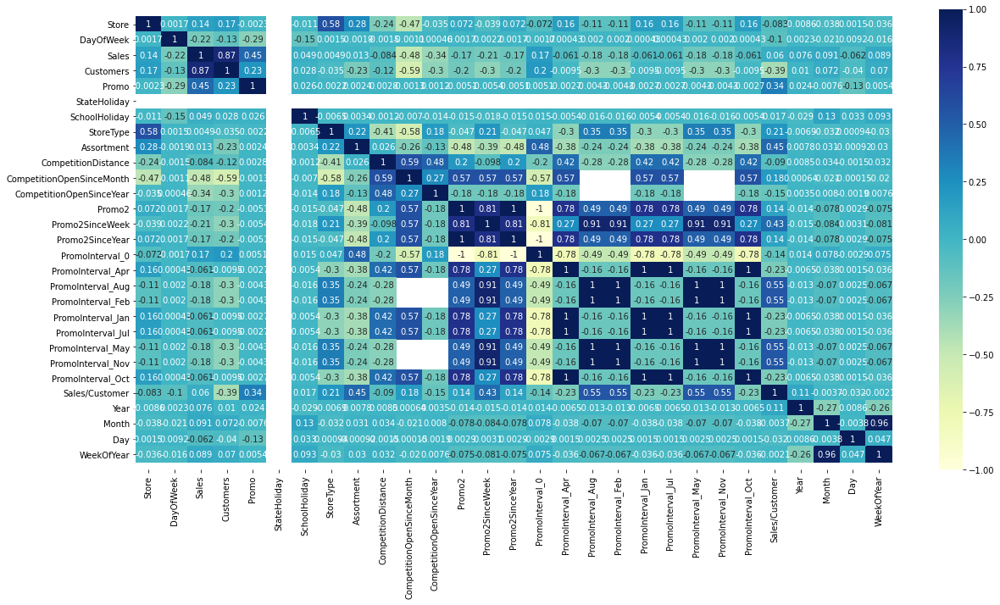

In [ ]:
plt.figure(figsize = (20, 10))

corHeatmap=sns.heatmap(df.corr(), annot = True,cmap="YlGnBu")
#below 2 lines are for temporary fix for matplotlib regression feature which broke heatmap  between 3.1.0 and 3.1.1
bottom, top = corHeatmap.get_ylim()
corHeatmap.set_ylim(bottom + 0.5, top - 0.5)
plt.show()


In [ ]:
cor = df.corr()
#Correlation with output variable
cor_target = abs(cor["Sales"])
#Selecting highly correlated features
relevant_features = cor_target[cor_target>0.5]
relevant_features

Sales       1.00
Customers   0.87
Name: Sales, dtype: float64

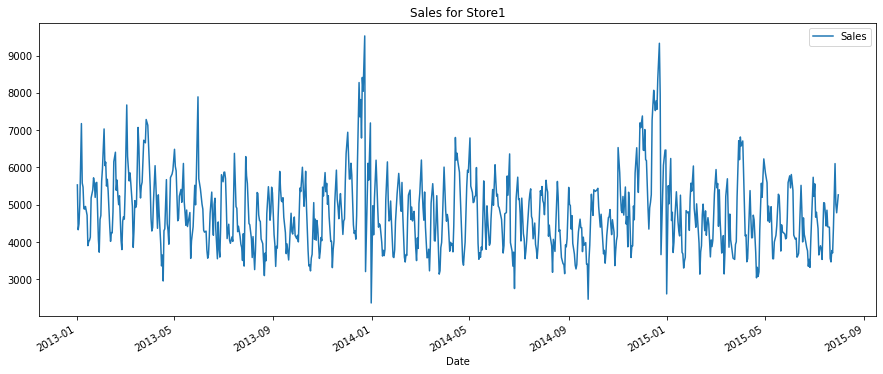

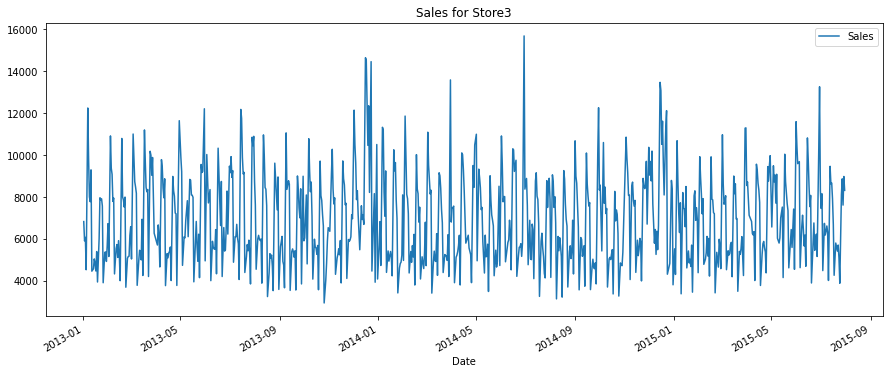

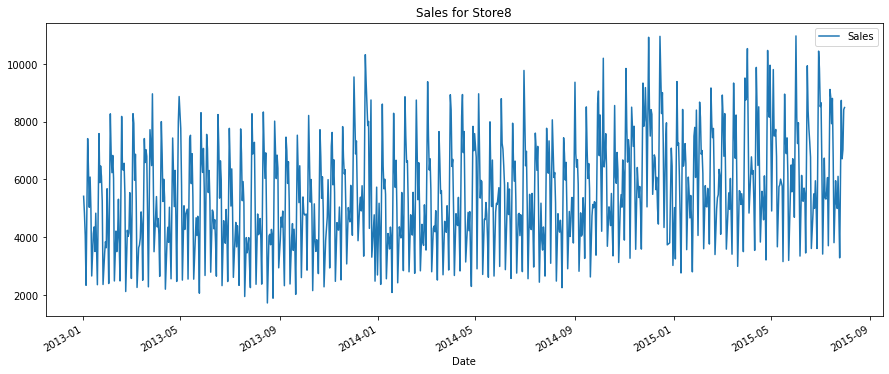

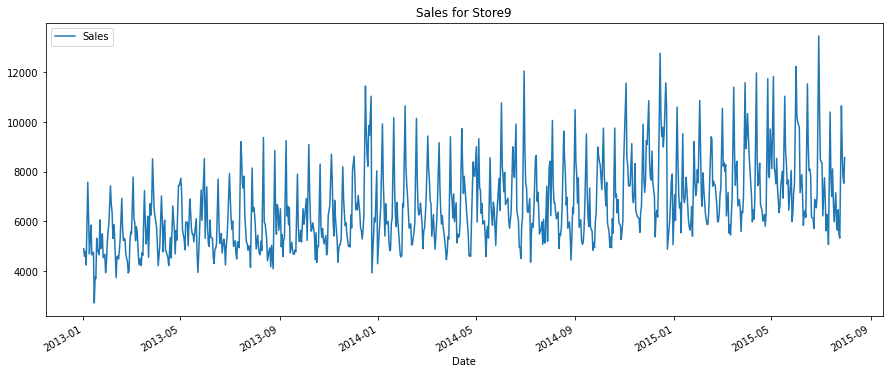

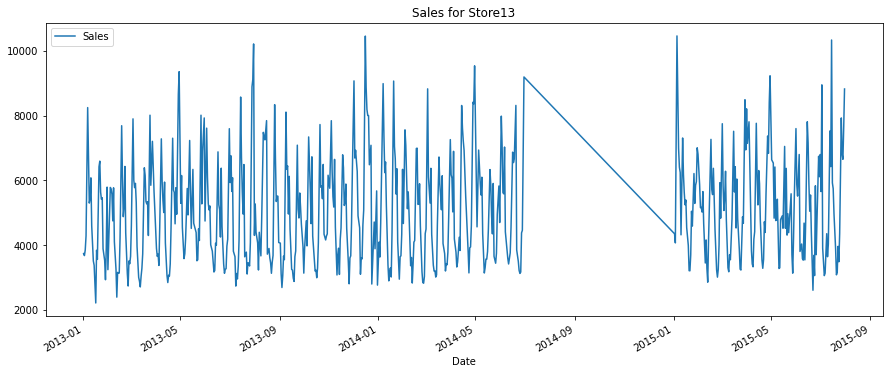

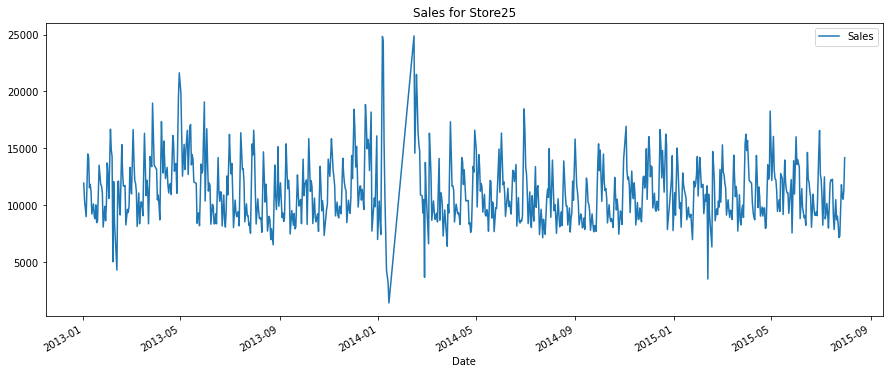

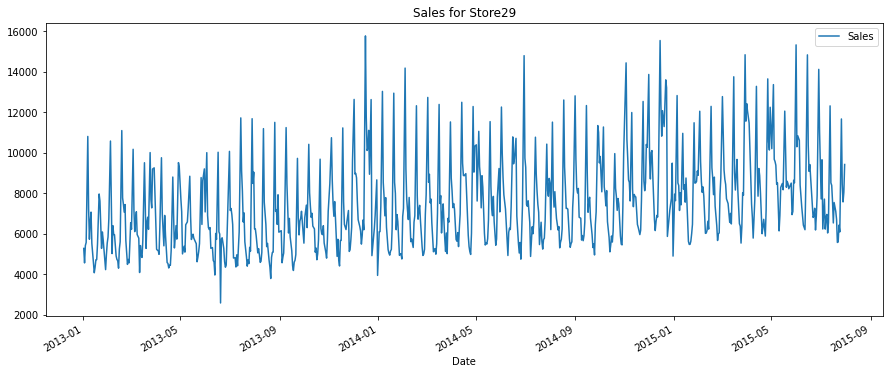

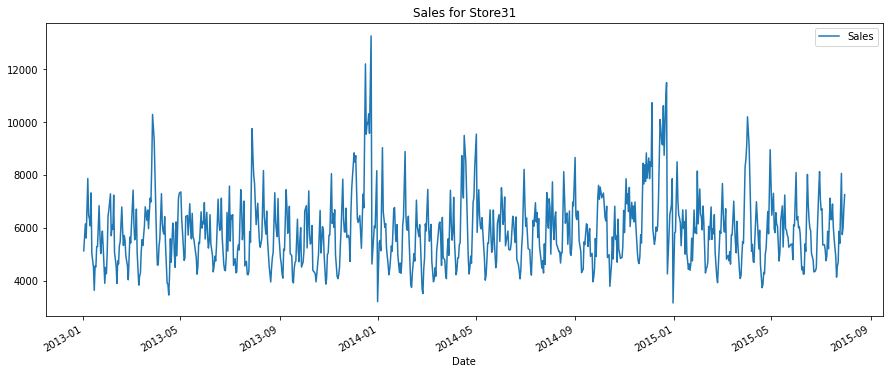

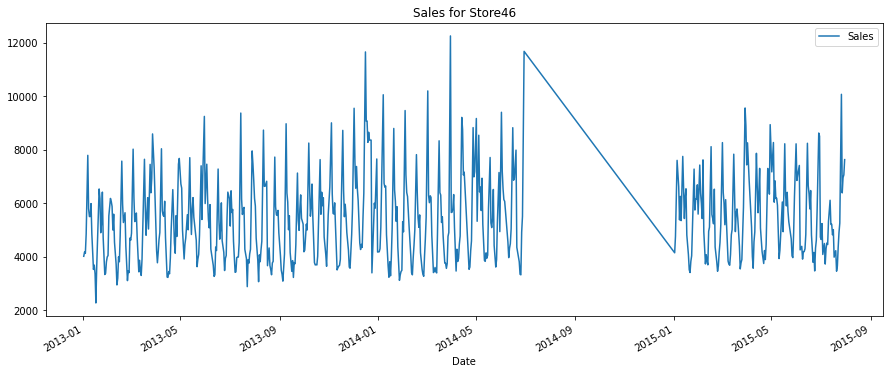

In [ ]:
for store in Prediction_stores:
    df[df.Store == store].plot(y='Sales',x="Date",figsize = (15,6))
    plt.title('Sales for Store'+str(store))

    plt.show(block=False)

In [ ]:
#Create seprate df for each store
StoreData={}
for store in Prediction_stores:
    StoreData[store]=df[df.Store == store].set_index(['Date'])



In [ ]:
StoreData[9]

,Store,DayOfWeek,Sales,Customers,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval_0,PromoInterval_Apr,PromoInterval_Aug,PromoInterval_Feb,PromoInterval_Jan,PromoInterval_Jul,PromoInterval_May,PromoInterval_Nov,PromoInterval_Oct,Sales/Customer,Year,Month,Day,WeekOfYear
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-07-31,9,5,8565,687,1,0,1,1,3,"2,030.00",8.00,"2,000.00",0,0.00,0.00,1,0,0,0,0,0,0,0,0,12.47,2015,7,31,31
2015-07-30,9,4,7539,651,1,0,1,1,3,"2,030.00",8.00,"2,000.00",0,0.00,0.00,1,0,0,0,0,0,0,0,0,11.58,2015,7,30,31
2015-07-29,9,3,7776,625,1,0,1,1,3,"2,030.00",8.00,"2,000.00",0,0.00,0.00,1,0,0,0,0,0,0,0,0,12.44,2015,7,29,31
2015-07-28,9,2,8751,678,1,0,1,1,3,"2,030.00",8.00,"2,000.00",0,0.00,0.00,1,0,0,0,0,0,0,0,0,12.91,2015,7,28,31
2015-07-27,9,1,10649,777,1,0,1,1,3,"2,030.00",8.00,"2,000.00",0,0.00,0.00,1,0,0,0,0,0,0,0,0,13.71,2015,7,27,31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2013-01-07,9,1,7574,605,1,0,0,1,3,"2,030.00",8.00,"2,000.00",0,0.00,0.00,1,0,0,0,0,0,0,0,0,12.52,2013,1,7,2
2013-01-05,9,6,4254,450,0,0,0,1,3,"2,030.00",8.00,"2,000.00",0,0.00,0.00,1,0,0,0,0,0,0,0,0,9.45,2013,1,5,1
2013-01-04,9,5,4798,497,0,0,1,1,3,"2,030.00",8.00,"2,000.00",0,0.00,0.00,1,0,0,0,0,0,0,0,0,9.65,2013,1,4,1


In [ ]:

def fillDates(dataFrame):
    idx = pd.date_range(dataFrame.index.min(), dataFrame.index.max())

    dataFrame.index = pd.DatetimeIndex(dataFrame.index)
    dataFrame = dataFrame.reindex(idx, fill_value=np.nan)
    dataFrame.index.name = 'Date'
    return dataFrame





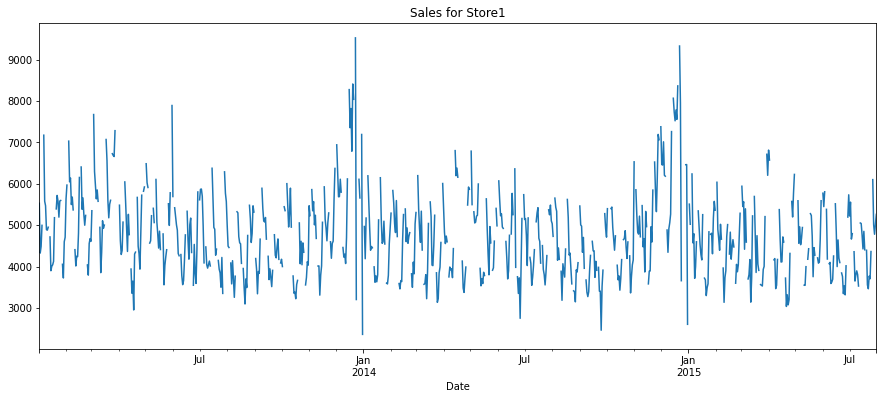

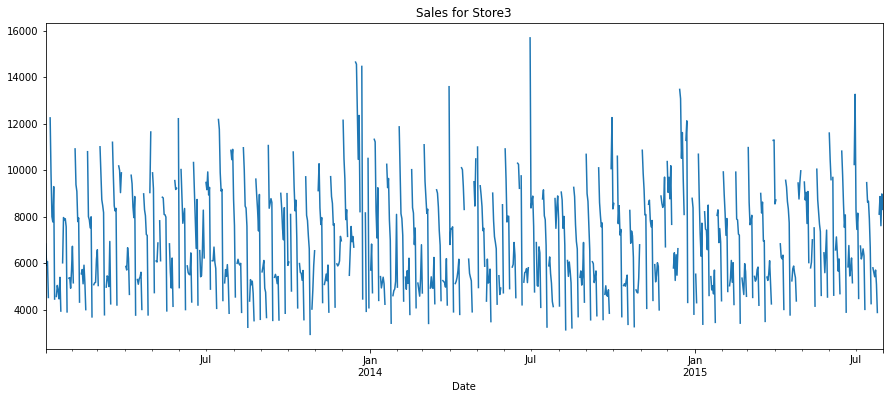

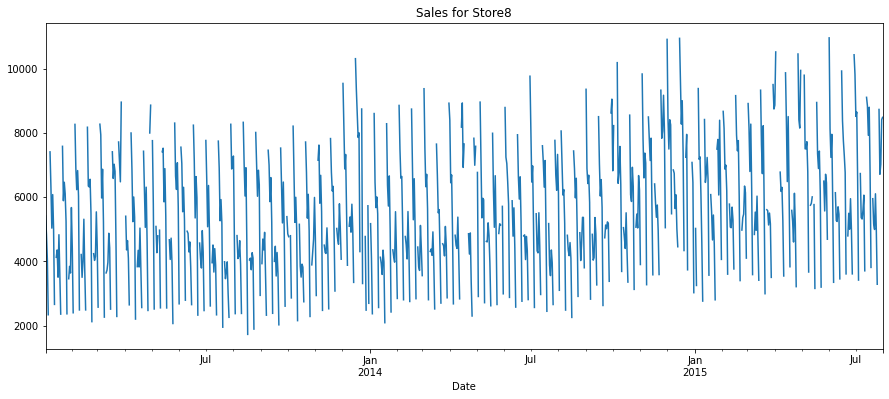

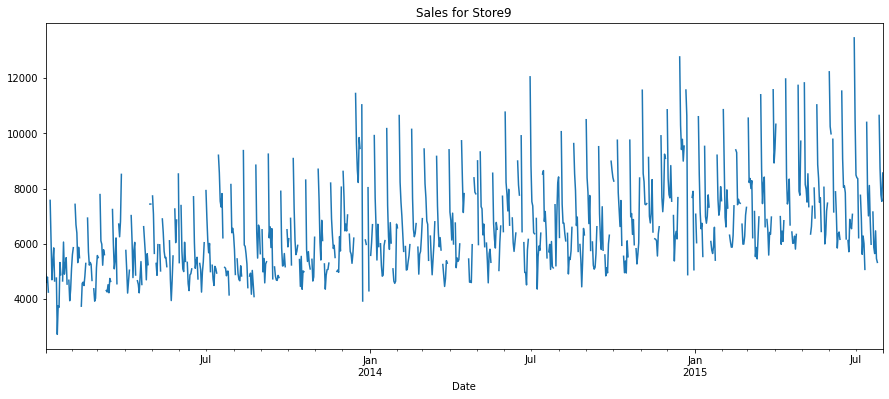

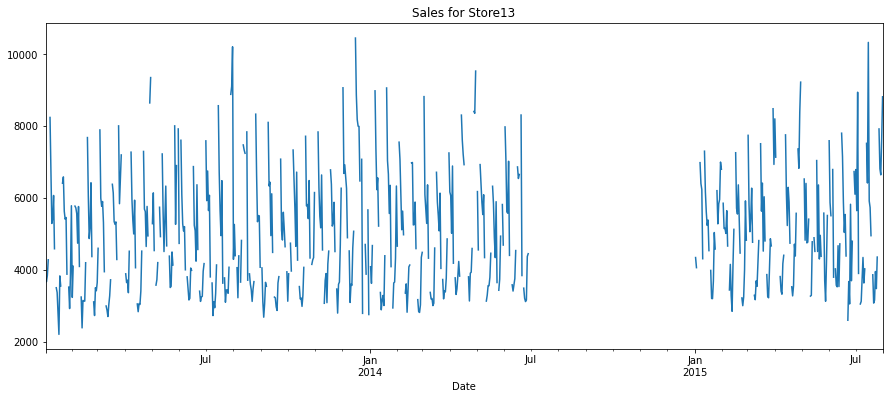

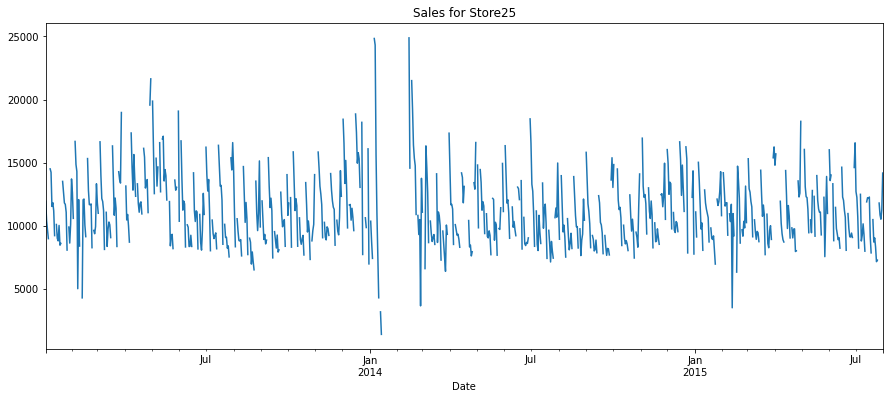

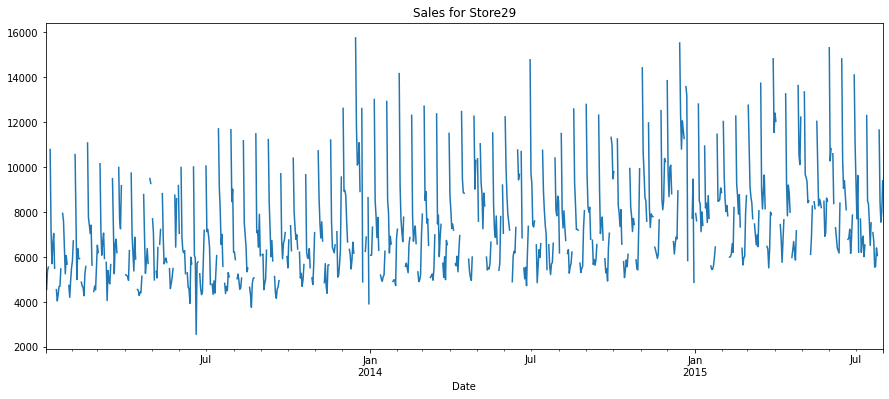

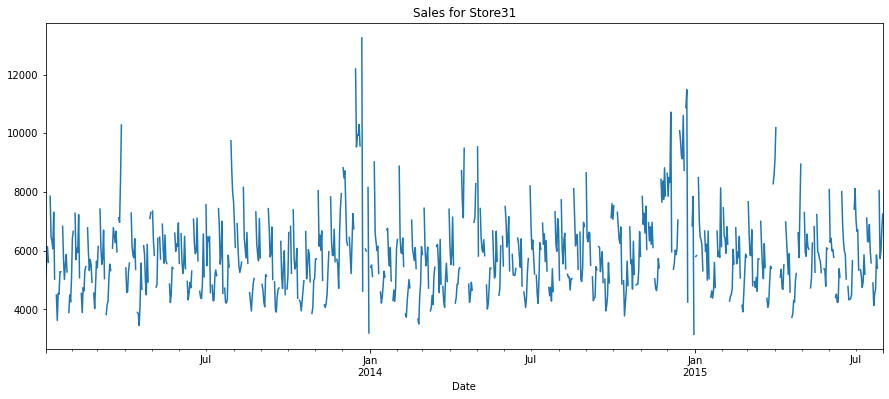

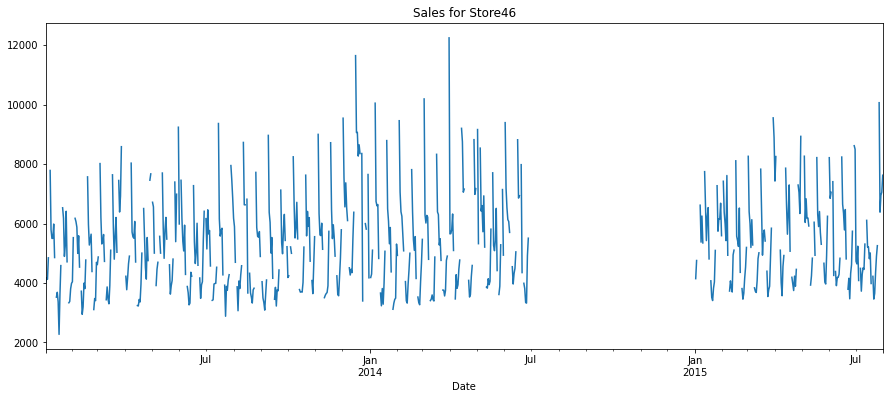

In [ ]:
for store in Prediction_stores:
    StoreData[store]=fillDates(StoreData[store])
    StoreData[store]['Sales'].replace("NaN",np.nan,inplace=True)
    StoreData[store]['Customers'].replace("NaN",np.nan,inplace=True)
    StoreData[store]['Sales/Customer'].replace("NaN",np.nan,inplace=True)

    # StoreData[store]['Customers'].plot(y='Sales',figsize = (15,6))
    StoreData[store]['Sales'].astype(float).plot(y='Sales',figsize = (15,6))
    plt.title('Sales for Store'+str(store))
    
    plt.show(block=False)
# StoreData[46][(StoreData[46].index >'2014-07-01') & (StoreData[46].index <'2015-01-02')]

In [ ]:
# for store in Prediction_stores:
#     StoreData[store]=fillDates(StoreData[store])
  
#     plt.title('Customers for Store'+str(store))
    
#     plt.show(block=False)
# # StoreData[46][(StoreData[46].index >'2014-07-01') & (StoreData[46].index <'2015-01-02')]

In [ ]:
#impute data with same dates data from last year  

from dateutil.relativedelta import relativedelta
def previousYearBlockReplace(data,startdate,enddate,store,column):
    for index, row in data.iterrows():
        if ((pd.isna(row[column]) and (index.strftime("%Y-%m-%d") > startdate) and (index.strftime("%Y-%m-%d") < enddate))):
            date=pd.to_datetime(index)
            previousYearDate=date- relativedelta(years=1)
            previousYearDate= previousYearDate.strftime("%Y-%m-%d")
            previousYearData=StoreData[store][StoreData[store].index==previousYearDate][column]
            StoreData[store].loc[index.strftime("%Y-%m-%d"), column]=previousYearData.get(previousYearDate)
#         print(StoreData[46][StoreData[46].index==index.strftime("%Y-%m-%d")]['Sales'])
  

    
    


In [ ]:
previousYearBlockReplace(StoreData[13],'2014-07-01','2015-01-02',13,'Sales')    

previousYearBlockReplace(StoreData[46],'2014-07-01','2015-01-02',46,'Sales') 

previousYearBlockReplace(StoreData[13],'2014-07-01','2015-01-02',13,'Customers')    

previousYearBlockReplace(StoreData[46],'2014-07-01','2015-01-02',46,'Customers')    


    
StoreData[46][(StoreData[46].index >'2014-07-15') & (StoreData[46].index <'2015-01-02')]

,Store,DayOfWeek,Sales,Customers,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval_0,PromoInterval_Apr,PromoInterval_Aug,PromoInterval_Feb,PromoInterval_Jan,PromoInterval_Jul,PromoInterval_May,PromoInterval_Nov,PromoInterval_Oct,Sales/Customer,Year,Month,Day,WeekOfYear
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-07-16,nan,nan,"6,157.00",690.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2014-07-17,nan,nan,"5,579.00",686.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2014-07-18,nan,nan,"5,781.00",714.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2014-07-19,nan,nan,"5,844.00",708.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2014-07-20,nan,nan,"4,276.00",619.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-12-28,nan,nan,"5,814.00",738.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2014-12-29,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2014-12-30,nan,nan,"7,652.00",937.00,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


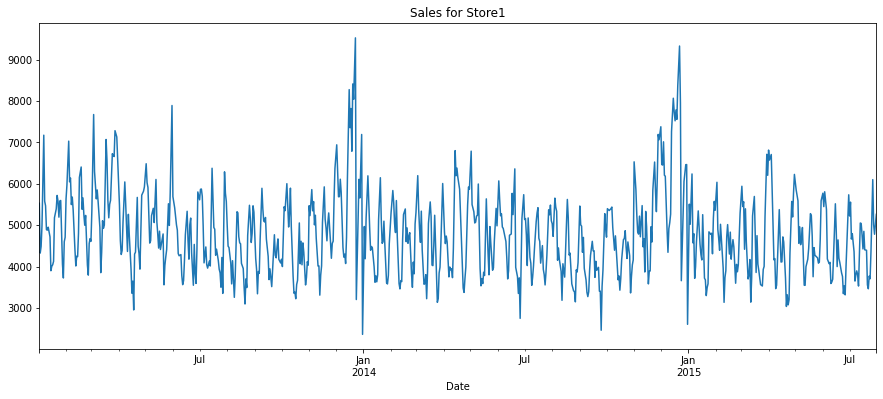

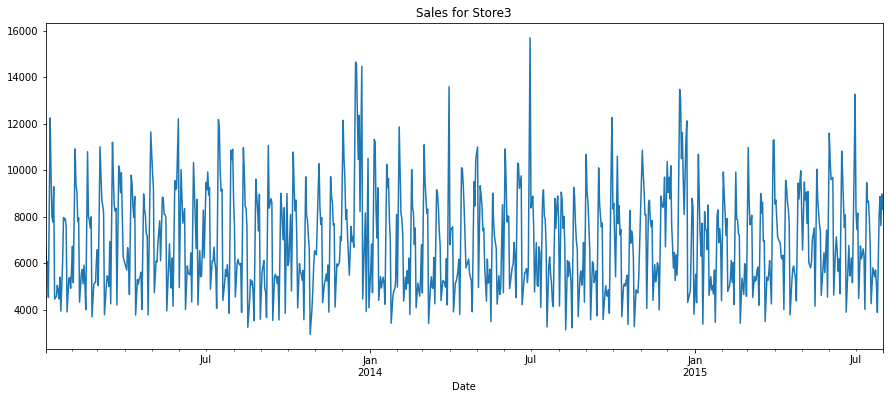

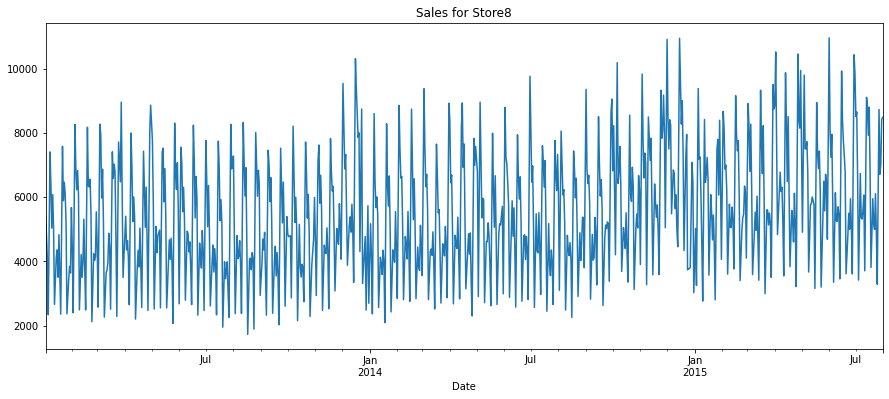

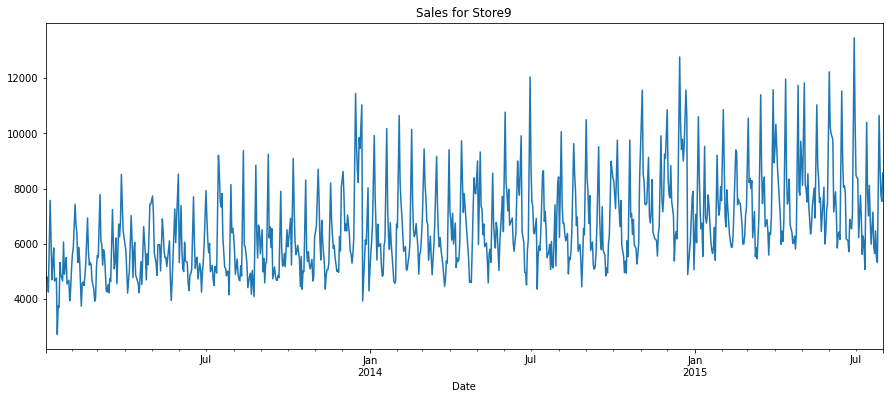

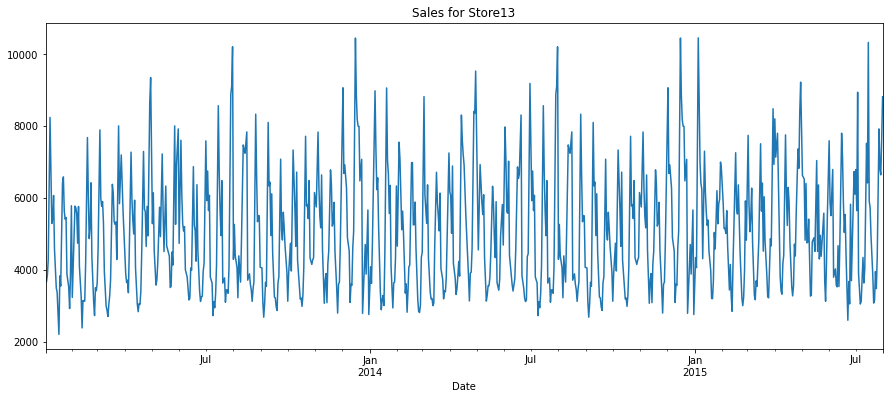

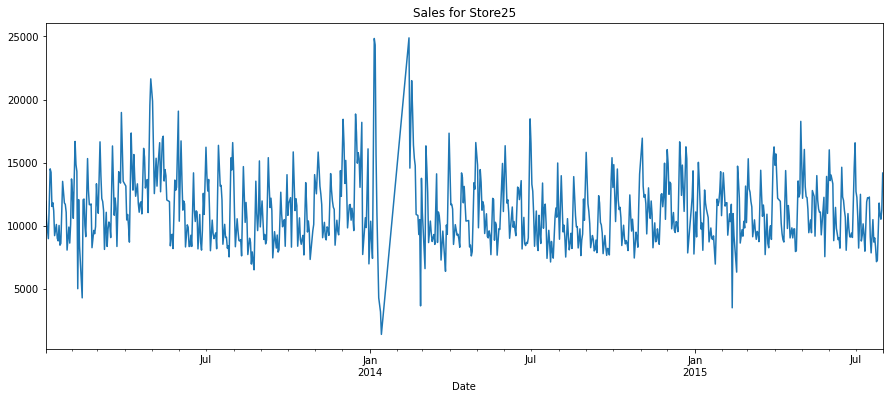

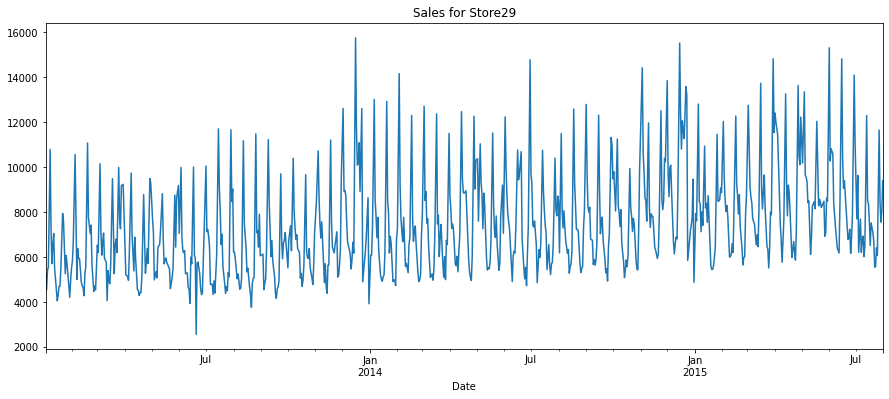

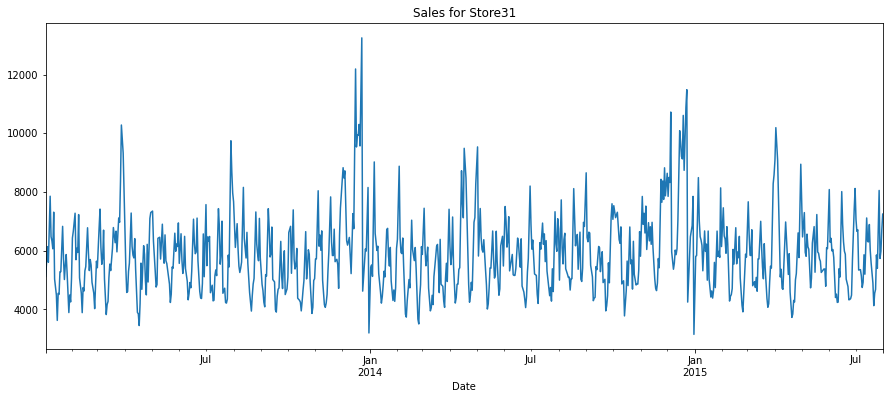

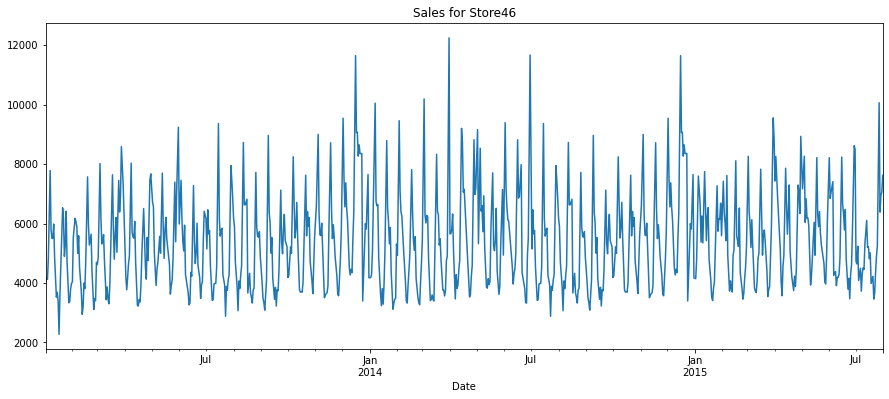

In [ ]:
for store in Prediction_stores:
    StoreData[store]=fillDates(StoreData[store])
    StoreData[store]['Sales'].replace("NaN",np.nan,inplace=True)
    StoreData[store]['Sales']=StoreData[store]['Sales'].interpolate(method="linear")
    StoreData[store]['Customers'].replace("NaN",np.nan,inplace=True)    
    StoreData[store]['Customers']=StoreData[store]['Customers'].interpolate(method="linear")
    StoreData[store]['Sales/Customer'].replace("NaN",np.nan,inplace=True)    
    StoreData[store]['Sales/Customer']=StoreData[store]['Customers'].interpolate(method="linear")
    StoreData[store]['Sales'].astype(float).plot(y='Sales',figsize = (15,6),)
    plt.title('Sales for Store'+str(store))
    
    plt.show(block=False)


In [ ]:
#handling missing data for other columns after interpolation
promo2col=['PromoInterval_0','PromoInterval_Apr',
                     'PromoInterval_Aug','PromoInterval_Feb',
                     'PromoInterval_Jan','PromoInterval_Jul',
                     'PromoInterval_May','PromoInterval_Nov',
                     'PromoInterval_Oct']
for store in Prediction_stores:

    #columns for train.csv  
    StoreData[store]['Promo'].fillna(StoreData[store]['Promo'].median(), inplace=True)
    StoreData[store]['StateHoliday'].fillna(StoreData[store]['StateHoliday'].median(), inplace=True)
    StoreData[store]['SchoolHoliday'].fillna(StoreData[store]['SchoolHoliday'].median(), inplace=True)
    StoreData[store]['Store'].fillna(store, inplace=True)


    #columns from store.csv
    StoreData[store]['StoreType'] = StoreData[store]['StoreType'].ffill().bfill()
    StoreData[store]['Assortment'] = StoreData[store]['Assortment'].ffill().bfill()

    StoreData[store]['Promo2'] = StoreData[store]['Promo2'].ffill().bfill()
    StoreData[store]['Promo2SinceWeek'] = StoreData[store]['Promo2SinceWeek'].ffill().bfill()
    StoreData[store]['Promo2SinceYear'] = StoreData[store]['Promo2SinceYear'].ffill().bfill()
    

    StoreData[store]['CompetitionDistance'] = StoreData[store]['CompetitionDistance'].ffill().bfill()
    StoreData[store]['CompetitionOpenSinceMonth'] = StoreData[store]['CompetitionOpenSinceMonth'].ffill().bfill()
    StoreData[store]['CompetitionOpenSinceYear'] = StoreData[store]['CompetitionOpenSinceYear'].ffill().bfill()
   

    StoreData[store][promo2col]=StoreData[store][promo2col].ffill().bfill()
    
    
    
    StoreData[store]['Year'] = StoreData[store].index.year
    StoreData[store]['Month'] = StoreData[store].index.month
    StoreData[store]['Day'] = StoreData[store].index.day
    StoreData[store]['WeekOfYear'] = StoreData[store].index.weekofyear
    StoreData[store]['DayOfWeek'] = StoreData[store].index.dayofweek
    StoreData[store]['Sales/Customer'] =  StoreData[store]['Sales']/ StoreData[store]['Customers']


    
    #capping
    percentiles = StoreData[store]['Sales'].quantile([0.01,0.99]).values
    StoreData[store]['Sales'][StoreData[store]['Sales'] <= percentiles[0]] = percentiles[0]
    StoreData[store]['Sales'][StoreData[store]['Sales'] >= percentiles[1]] = percentiles[1]

    
    percentiles = StoreData[store]['Customers'].quantile([0.01,0.99]).values
    StoreData[store]['Customers'][StoreData[store]['Customers'] <= percentiles[0]] = percentiles[0]
    StoreData[store]['Customers'][StoreData[store]['Customers'] >= percentiles[1]] = percentiles[1]
    
    percentiles = StoreData[store]['Sales/Customer'].quantile([0.01,0.99]).values
    StoreData[store]['Sales/Customer'][StoreData[store]['Sales/Customer'] <= percentiles[0]] = percentiles[0]
    StoreData[store]['Sales/Customer'][StoreData[store]['Sales/Customer'] >= percentiles[1]] = percentiles[1]


  
    




In [ ]:
StoreData[1]

,Store,DayOfWeek,Sales,Customers,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval_0,PromoInterval_Apr,PromoInterval_Aug,PromoInterval_Feb,PromoInterval_Jan,PromoInterval_Jul,PromoInterval_May,PromoInterval_Nov,PromoInterval_Oct,Sales/Customer,Year,Month,Day,WeekOfYear
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-02,1.00,2,"5,530.00",668.00,0.00,0.00,1.00,3.00,1.00,"1,270.00",9.00,"2,008.00",0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8.28,2013,1,2,1
2013-01-03,1.00,3,"4,327.00",578.00,0.00,0.00,1.00,3.00,1.00,"1,270.00",9.00,"2,008.00",0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,7.49,2013,1,3,1
2013-01-04,1.00,4,"4,486.00",619.00,0.00,0.00,1.00,3.00,1.00,"1,270.00",9.00,"2,008.00",0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,7.25,2013,1,4,1
2013-01-05,1.00,5,"4,997.00",635.00,0.00,0.00,1.00,3.00,1.00,"1,270.00",9.00,"2,008.00",0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,7.87,2013,1,5,1
2013-01-06,1.00,6,"6,086.50",710.00,0.00,0.00,0.00,3.00,1.00,"1,270.00",9.00,"2,008.00",0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8.57,2013,1,6,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-07-27,1.00,0,"6,102.00",612.00,1.00,0.00,1.00,3.00,1.00,"1,270.00",9.00,"2,008.00",0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,9.97,2015,7,27,31
2015-07-28,1.00,1,"5,011.00",560.00,1.00,0.00,1.00,3.00,1.00,"1,270.00",9.00,"2,008.00",0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8.95,2015,7,28,31
2015-07-29,1.00,2,"4,782.00",523.00,1.00,0.00,1.00,3.00,1.00,"1,270.00",9.00,"2,008.00",0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,9.14,2015,7,29,31


In [ ]:
#checking  store 46 where we did major interpolation
print(StoreData[46].isnull().sum())

Store                        0
DayOfWeek                    0
Sales                        0
Customers                    0
Promo                        0
StateHoliday                 0
SchoolHoliday                0
StoreType                    0
Assortment                   0
CompetitionDistance          0
CompetitionOpenSinceMonth    0
CompetitionOpenSinceYear     0
Promo2                       0
Promo2SinceWeek              0
Promo2SinceYear              0
PromoInterval_0              0
PromoInterval_Apr            0
PromoInterval_Aug            0
PromoInterval_Feb            0
PromoInterval_Jan            0
PromoInterval_Jul            0
PromoInterval_May            0
PromoInterval_Nov            0
PromoInterval_Oct            0
Sales/Customer               0
Year                         0
Month                        0
Day                          0
WeekOfYear                   0
dtype: int64


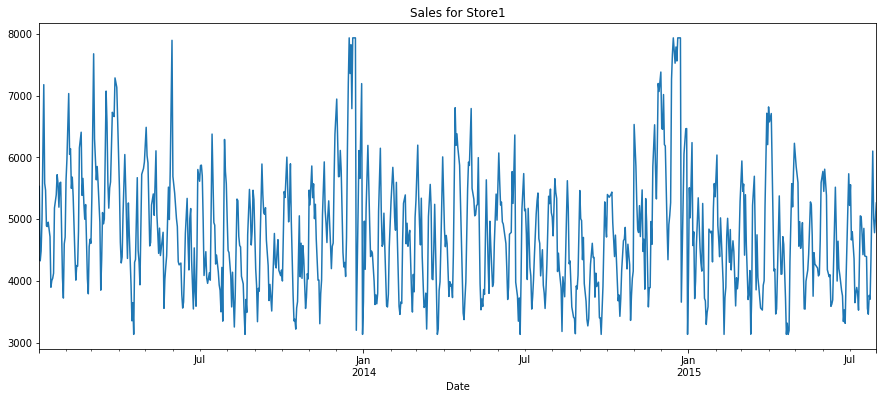

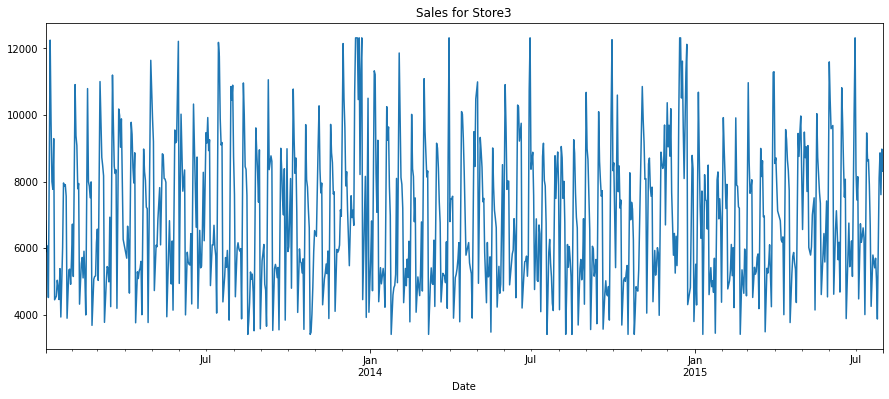

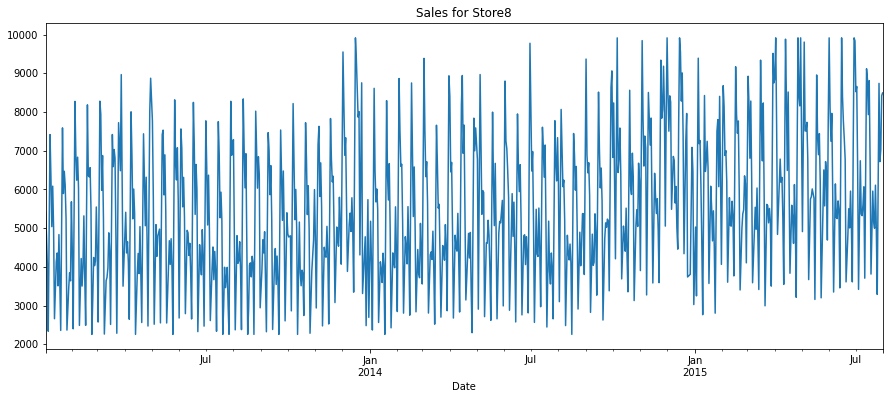

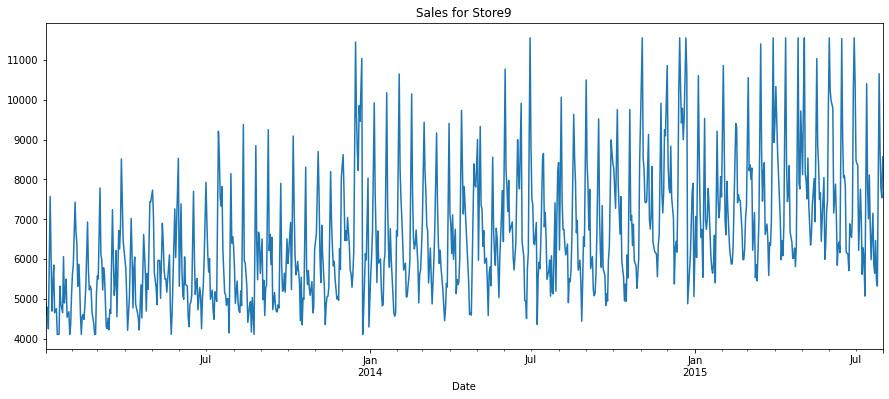

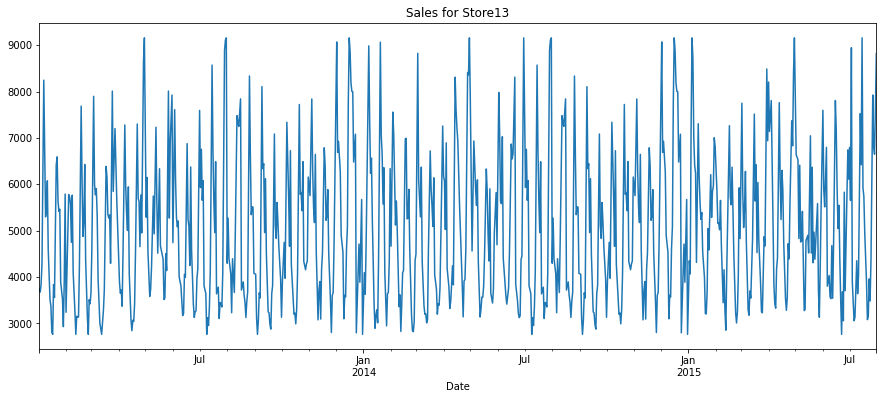

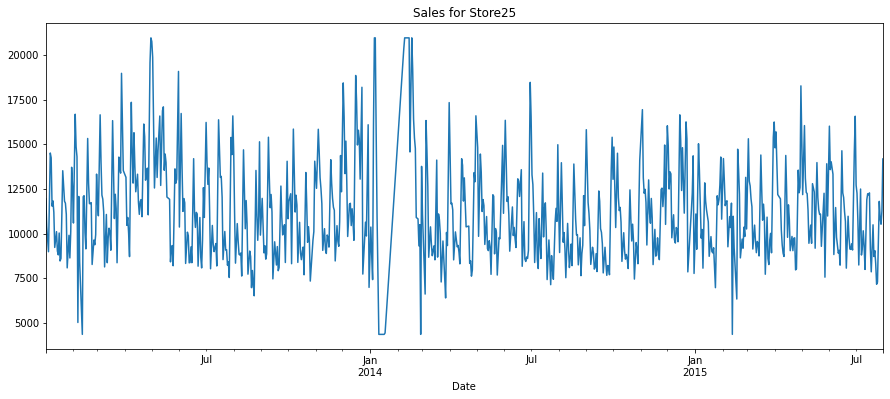

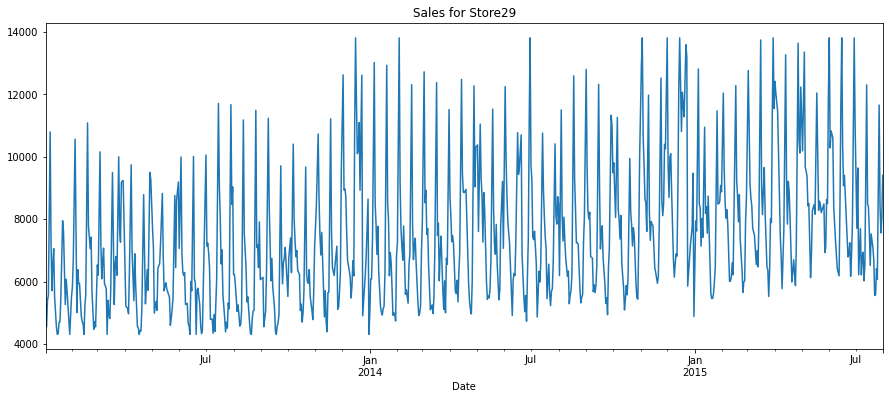

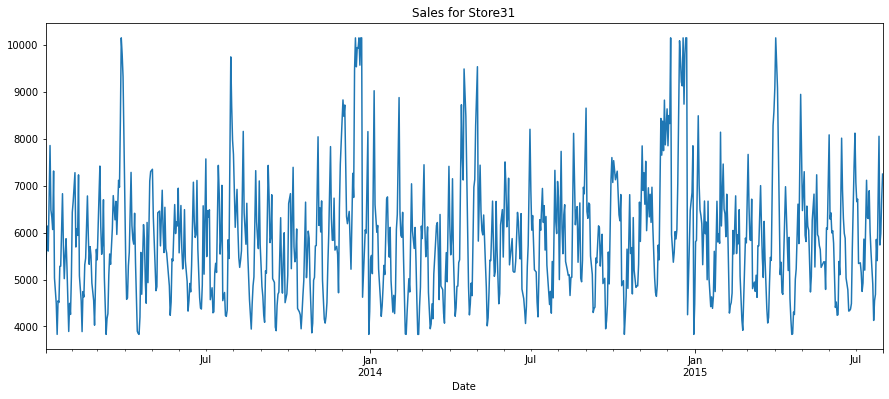

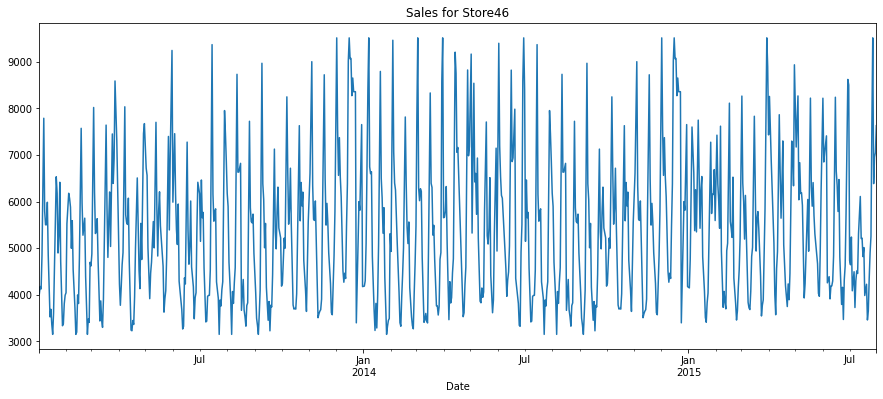

In [ ]:

for store in Prediction_stores:
    StoreData[store]['Sales'].astype(float).plot(y='Sales',figsize = (15,6),)
    plt.title('Sales for Store'+str(store))
    
    plt.show(block=False)


##### Stationarity check

In [ ]:
from statsmodels.tsa.stattools import adfuller
NonStationarySales=[]
def StationarityCheckSales(data,store,signif=0.05):

    r = adfuller(data['Sales'], autolag='AIC')
    output = {'test_statistic':round(r[0], 4), 'pvalue':round(r[1], 4), 'n_lags':round(r[2], 4), 'n_obs':r[3]}
    p_value = output['pvalue'] 
    def adjust(val, length= 6): return str(val).ljust(length)

    # Print Summary
    print('\033[1m  Augmented Dickey-Fuller Test on Sales for Store:' , store, '\033[0m ')
    print(f' Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f' Significance Level    = {signif}')
    print(f' Test Statistic        = {output["test_statistic"]}')
    print(f' No. Lags Chosen       = {output["n_lags"]}')

    for key,val in r[4].items():
        print(f' Critical value {adjust(key)} = {round(val, 3)}')

    if p_value <= signif:
        print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f" => Series is Stationary.")
    else:
        print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
        print(f" => Series is Non-Stationary.")
        NonStationarySales.append(store)
          
    print('\n')

In [ ]:
NonStationaryCustomers=[]
def StationarityCheckCustomers(data,store,signif=0.05):

    r = adfuller(data['Customers'], autolag='AIC')
    output = {'test_statistic':round(r[0], 4), 'pvalue':round(r[1], 4), 'n_lags':round(r[2], 4), 'n_obs':r[3]}
    p_value = output['pvalue'] 
    def adjust(val, length= 6): return str(val).ljust(length)

    # Print Summary
    print('\033[1m Augmented Dickey-Fuller Test on Customers for Store:', store, '\033[0m ')
    print(f' Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f' Significance Level    = {signif}')
    print(f' Test Statistic        = {output["test_statistic"]}')
    print(f' No. Lags Chosen       = {output["n_lags"]}')

    for key,val in r[4].items():
        print(f' Critical value {adjust(key)} = {round(val, 3)}')

    if p_value <= signif:
        print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f" => Series is Stationary.")
    else:
        print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
        print(f" => Series is Non-Stationary.")
        NonStationaryCustomers.append(store)
          
    print('\n')

In [ ]:
NonStationarySalesPerCustomers=[]
def StationarityCheckSalesPerCustomer(data,store,signif=0.05):

    r = adfuller(data['Sales/Customer'], autolag='AIC')
    output = {'test_statistic':round(r[0], 4), 'pvalue':round(r[1], 4), 'n_lags':round(r[2], 4), 'n_obs':r[3]}
    p_value = output['pvalue'] 
    def adjust(val, length= 6): return str(val).ljust(length)

    # Print Summary
    print('\033[1m  Augmented Dickey-Fuller Test on Sales/Customer for Store:',store, '\033[0m ')
    print(f' Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f' Significance Level    = {signif}')
    print(f' Test Statistic        = {output["test_statistic"]}')
    print(f' No. Lags Chosen       = {output["n_lags"]}')

    for key,val in r[4].items():
        print(f' Critical value {adjust(key)} = {round(val, 3)}')

    if p_value <= signif:
        print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f" => Series is Stationary.")
    else:
        print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
        print(f" => Series is Non-Stationary.")
        NonStationarySalesPerCustomers.append(store)
          
    print('\n')

In [ ]:
#Sales Stationarity check
for store in Prediction_stores:
    StationarityCheckSales(StoreData[store],store)


  Augmented Dickey-Fuller Test on Sales for Store: 1  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -5.2494
 No. Lags Chosen       = 17
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


  Augmented Dickey-Fuller Test on Sales for Store: 3  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -5.8052
 No. Lags Chosen       = 22
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


  Augmented Dickey-Fuller Test on Sales for Store: 8  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -3.3823
 No. Lags Chosen       = 21
 Critical value 1%     = -3.437
 Critical value 5%     = -2.

In [ ]:
#Customers Stationarity check
for store in Prediction_stores:
    StationarityCheckCustomers(StoreData[store],store)

    

 Augmented Dickey-Fuller Test on Customers for Store: 1  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -4.025
 No. Lags Chosen       = 21
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0013. Rejecting Null Hypothesis.
 => Series is Stationary.


 Augmented Dickey-Fuller Test on Customers for Store: 3  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -5.5075
 No. Lags Chosen       = 22
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


 Augmented Dickey-Fuller Test on Customers for Store: 8  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -3.1673
 No. Lags Chosen       = 21
 Critical value 1%     = -3.437
 Critical value 5

In [ ]:
#Customers Stationarity check
for store in Prediction_stores:
    StationarityCheckSalesPerCustomer(StoreData[store],store)

    

  Augmented Dickey-Fuller Test on Sales/Customer for Store: 1  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -6.5428
 No. Lags Chosen       = 16
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


  Augmented Dickey-Fuller Test on Sales/Customer for Store: 3  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -4.7429
 No. Lags Chosen       = 22
 Critical value 1%     = -3.437
 Critical value 5%     = -2.865
 Critical value 10%    = -2.568
 => P-Value = 0.0001. Rejecting Null Hypothesis.
 => Series is Stationary.


  Augmented Dickey-Fuller Test on Sales/Customer for Store: 8  
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -3.9547
 No. Lags Chosen       = 21
 Critical value 1%     = -3.43

In [ ]:
print('NonStationarySales:',NonStationarySales)
print('NonStationaryCustomers:',NonStationaryCustomers)
print('NonStationarySalesPerCustomers:',NonStationarySalesPerCustomers)

NonStationarySales: []
NonStationaryCustomers: []
NonStationarySalesPerCustomers: []


### All our timeseries are stationary

In [ ]:
#Lets see decomposition of our series
def plot_timeseries(data,store):
    print('\033[1m  Decomposition for Store:',store, '\033[0m ')

    rcParams['figure.figsize'] = 18,8
    decomposition = sm.tsa.seasonal_decompose(data['Sales'], model = "additive")
    decomposition.plot()
    
    plt.show(block=False)
    # fig.show()
    print('\n')
    print('\n')

  Decomposition for Store: 1  


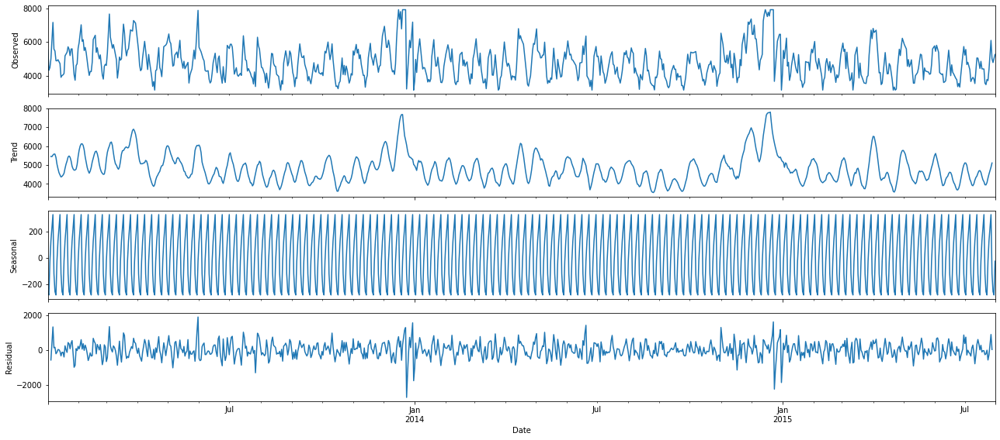





  Decomposition for Store: 3  


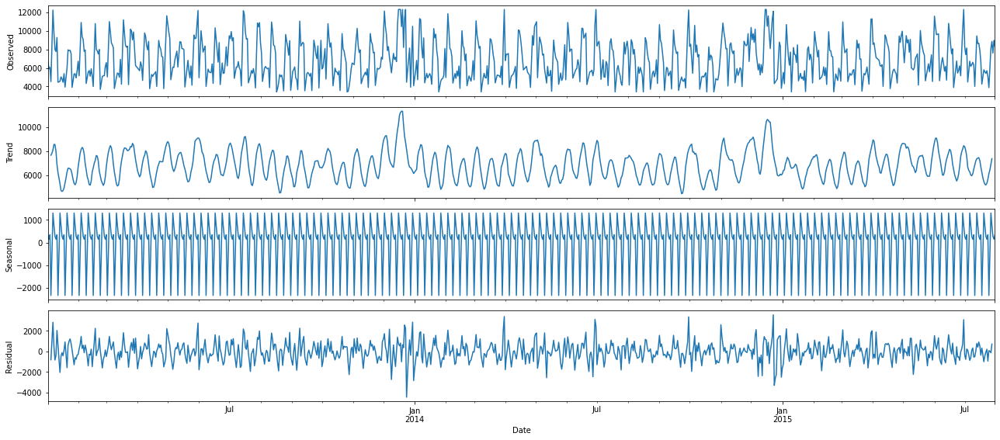





  Decomposition for Store: 8  


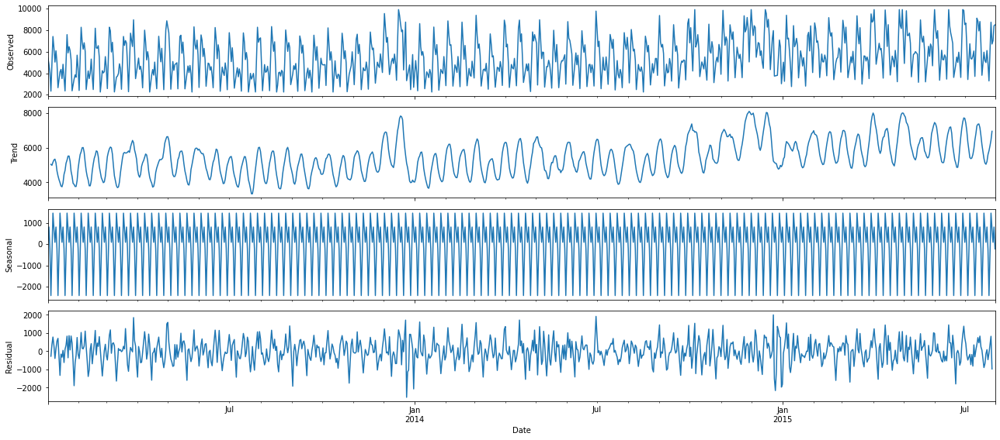





  Decomposition for Store: 9  


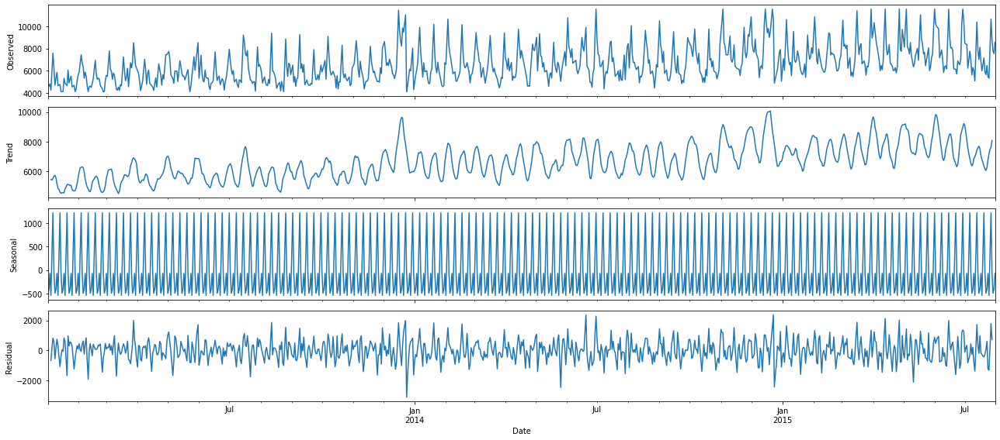





  Decomposition for Store: 13  


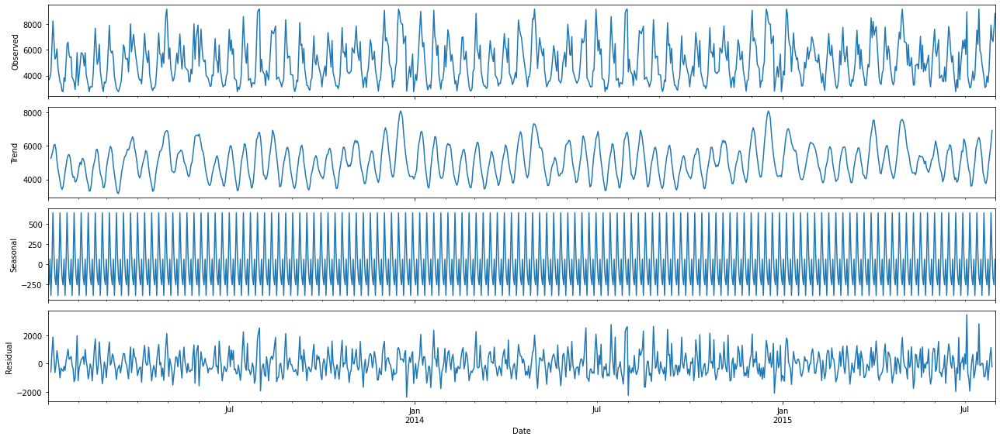





  Decomposition for Store: 25  


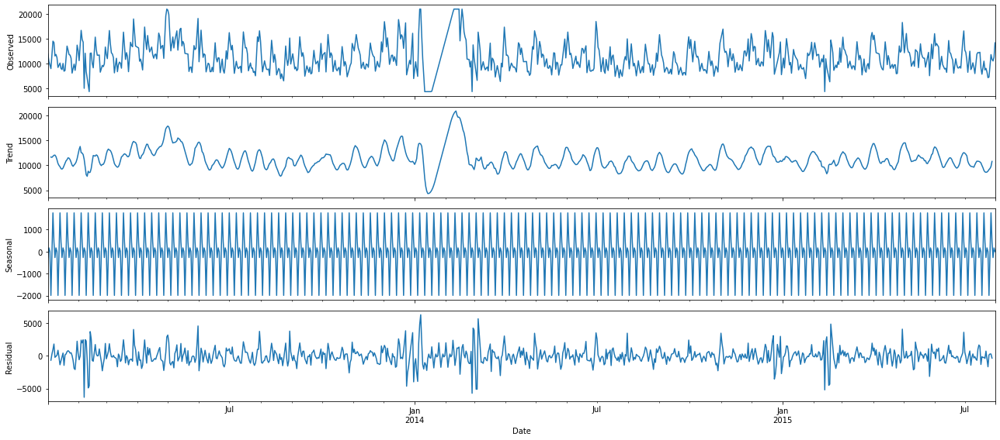





  Decomposition for Store: 29  


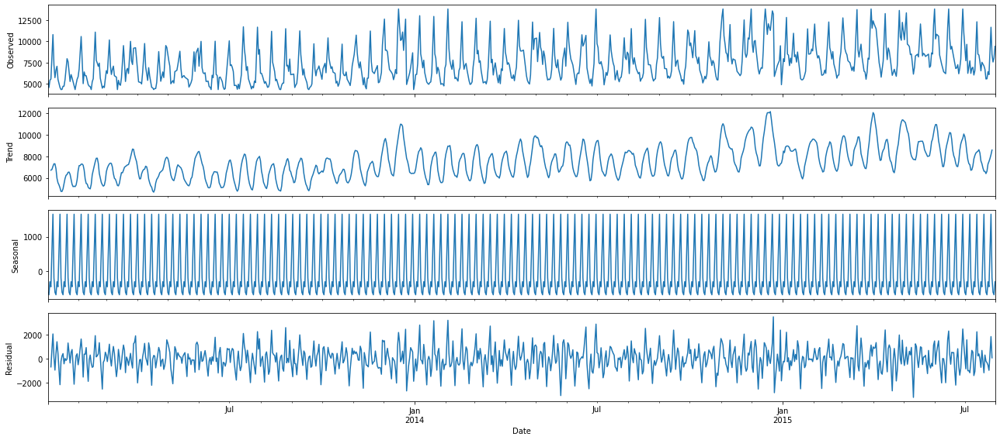





  Decomposition for Store: 31  


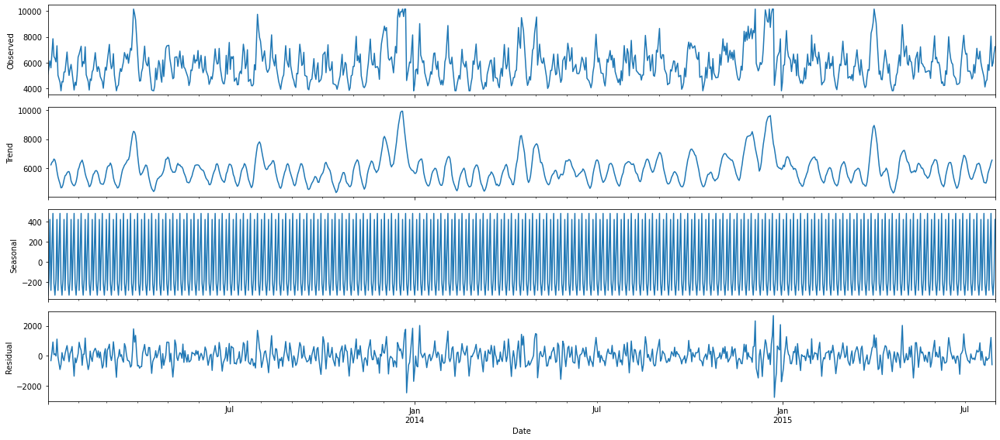





  Decomposition for Store: 46  


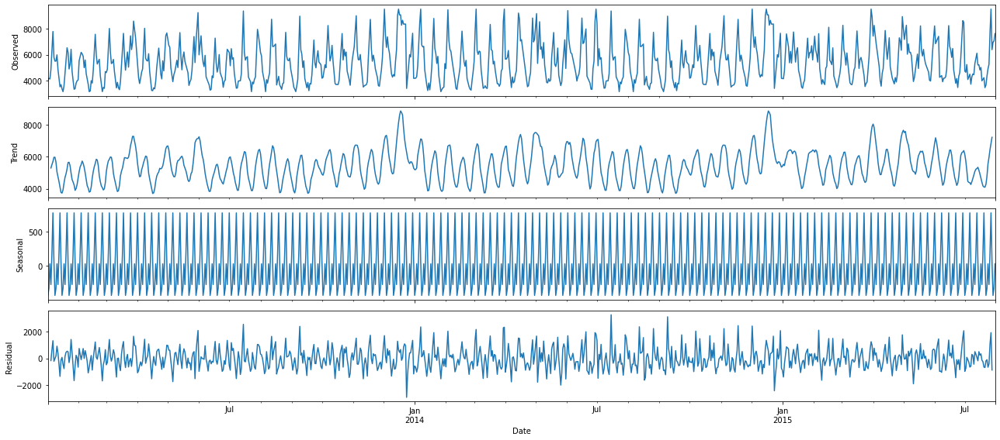

In [ ]:
for store in StoreData:
  plot_timeseries(StoreData[store],store)

Store 9 and 29 has slight trend so in our models we can play around with trend parameter

#### As all series are stationary there is no cointegration test needed as there is no long-run equilibrium relationship. But still, let's run the Johansen test and also see causality between variables using Grangers Causality test

**Reference**:
[Reference](https://www.degruyter.com/document/doi/10.21078/JSSI-2017-001-20/html#:~:text=The%20results%20of%20multivariate%20Johansen,monetary%20variables%20to%20equity%20prices.)

In [ ]:
def joh_output(res,store):
    print("\033[1m Johansen Test for Store: ",store,' \033[0m')
    output = pd.DataFrame([res.lr2,res.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",res.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",res.cvt,'\n')
    print('\n')

In [ ]:
for store in StoreData:
  joh_model1 = coint_johansen(StoreData[store][['Sales','Customers']],0,15) # k_ar_diff +1 = K
  joh_output(joh_model1,store)

 Johansen Test for Store:  1  
   max_eig_stat  trace_stat
0         49.97       58.89
1          8.92        8.92 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[12.2971 14.2639 18.52  ]
 [ 2.7055  3.8415  6.6349]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[13.4294 15.4943 19.9349]
 [ 2.7055  3.8415  6.6349]] 



 Johansen Test for Store:  3  
   max_eig_stat  trace_stat
0         62.45       88.10
1         25.65       25.65 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[12.2971 14.2639 18.52  ]
 [ 2.7055  3.8415  6.6349]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[13.4294 15.4943 19.9349]
 [ 2.7055  3.8415  6.6349]] 



 Johansen Test for Store:  8  
   max_eig_stat  trace_stat
0         42.10       58.96
1         16.86       16.86 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[12.2971 14.2639 18.52  ]
 [ 2.7055  3.8415  6.6349]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[13.4294 15.4943 19.9349]
 [ 2.7055  3.8415  6.6349]] 



 Johansen Test for 

In [ ]:
#Grangers Causality Test
from statsmodels.tsa.stattools import grangercausalitytests
maxlag=30
test = 'ssr_chi2test'
def grangers_causation_matrix(data, variables,store, test='ssr_chi2test', verbose=False):    
    print("\033[1m Grangers Causality Test for Store: ",store,'\033[0m')

    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
        for r in df.index:
            test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            df.loc[r, c] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    print(df)
    print('\n')

# StoreData[25].columns

In [ ]:
for store in StoreData:
  grangers_causation_matrix(StoreData[store], variables = StoreData[store][['Customers','Sales','Sales/Customer']].columns,store=store)    


 Grangers Causality Test for Store:  1 
                  Customers_x  Sales_x  Sales/Customer_x
Customers_y              1.00     0.00              0.00
Sales_y                  0.00     1.00              0.00
Sales/Customer_y         0.00     0.00              1.00


 Grangers Causality Test for Store:  3 
                  Customers_x  Sales_x  Sales/Customer_x
Customers_y              1.00     0.00              0.00
Sales_y                  0.00     1.00              0.00
Sales/Customer_y         0.00     0.00              1.00


 Grangers Causality Test for Store:  8 
                  Customers_x  Sales_x  Sales/Customer_x
Customers_y              1.00     0.00              0.00
Sales_y                  0.00     1.00              0.00
Sales/Customer_y         0.00     0.00              1.00


 Grangers Causality Test for Store:  9 
                  Customers_x  Sales_x  Sales/Customer_x
Customers_y              1.00     0.00              0.00
Sales_y                  0.00     1.

In [ ]:
#Create TrainTest Split 
#Start test from test.index.max - 6 weeks 
trainTestData={}

for store in Prediction_stores:
    startDate=StoreData[store].index.min().strftime("%Y-%m-%d")
    trainRange=StoreData[store].index.max()-relativedelta(weeks=6)
    testStart=trainRange+relativedelta(days=1)
    trainRange=trainRange.strftime("%Y-%m-%d")
    testStart=testStart.strftime("%Y-%m-%d")

    trainTestData[store]={}
    trainTestData[store]['train']=StoreData[store][startDate:trainRange]
    trainTestData[store]['test']=StoreData[store][testStart:]

    


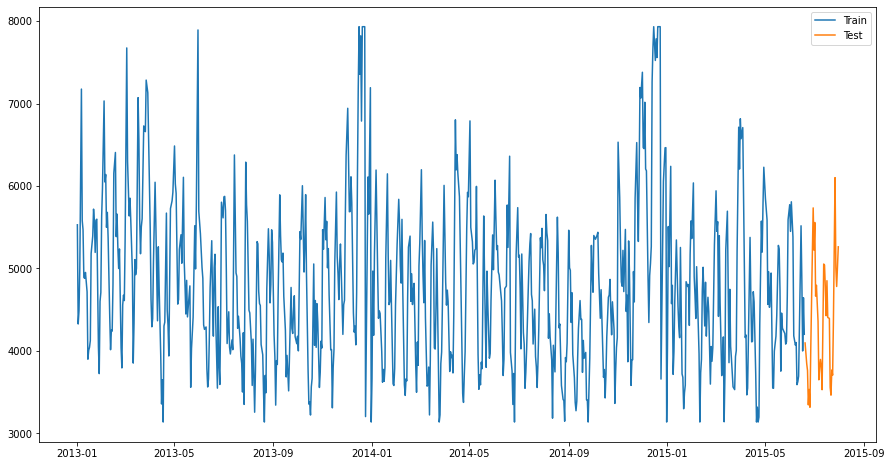

In [ ]:
#checking  train test split for one store
plt.figure(figsize=(15,8)) 
plt.plot(trainTestData[1]['train']['Sales'], label='Train')
plt.plot(trainTestData[1]['test']['Sales'], label='Test')
plt.legend(loc='best')
plt.show()

In [ ]:
trainTestData[1]['train'].tail(3).append(trainTestData[1]['test'].head(3))


,Store,DayOfWeek,Sales,Customers,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval_0,PromoInterval_Apr,PromoInterval_Aug,PromoInterval_Feb,PromoInterval_Jan,PromoInterval_Jul,PromoInterval_May,PromoInterval_Nov,PromoInterval_Oct,Sales/Customer,Year,Month,Day,WeekOfYear
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-06-17,1.00,2,"4,000.00",476.00,1.00,0.00,0.00,3.00,1.00,"1,270.00",9.00,"2,008.00",0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8.40,2015,6,17,25
2015-06-18,1.00,3,"4,645.00",498.00,1.00,0.00,0.00,3.00,1.00,"1,270.00",9.00,"2,008.00",0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,9.33,2015,6,18,25
2015-06-19,1.00,4,"4,202.00",487.00,1.00,0.00,0.00,3.00,1.00,"1,270.00",9.00,"2,008.00",0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8.63,2015,6,19,25
2015-06-20,1.00,5,"4,097.00",494.00,0.00,0.00,0.00,3.00,1.00,"1,270.00",9.00,"2,008.00",0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8.29,2015,6,20,25
2015-06-21,1.00,6,"3,971.50",491.50,0.00,0.00,0.00,3.00,1.00,"1,270.00",9.00,"2,008.00",0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8.08,2015,6,21,25
2015-06-22,1.00,0,"3,846.00",489.00,0.00,0.00,0.00,3.00,1.00,"1,270.00",9.00,"2,008.00",0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,7.87,2015,6,22,26


In [ ]:
#Scaling variables

#Sales/Customer should also be scaled if you are using it in model. But in our case, using it model is actually  degarding performance
#So will not scale it as we want to use this scaler to inverse transform later
scalers={}
from sklearn.preprocessing import StandardScaler

multivariateCol=['Sales','Customers']

for store in StoreData:
  scalers[store]= StandardScaler()
  scalers[store].fit(trainTestData[store]['train'][multivariateCol])
  trainTestData[store]['train'][multivariateCol] = scalers[store].transform(trainTestData[store]['train'][multivariateCol])
  trainTestData[store]['test'][multivariateCol] = scalers[store].transform(trainTestData[store]['test'][multivariateCol])
  


In [ ]:
trainTestData[1]['train'].tail(3).append(trainTestData[1]['test'].head(3))


,Store,DayOfWeek,Sales,Customers,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval_0,PromoInterval_Apr,PromoInterval_Aug,PromoInterval_Feb,PromoInterval_Jan,PromoInterval_Jul,PromoInterval_May,PromoInterval_Nov,PromoInterval_Oct,Sales/Customer,Year,Month,Day,WeekOfYear
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-06-17,1.00,2,-0.85,-1.07,1.00,0.00,0.00,3.00,1.00,"1,270.00",9.00,"2,008.00",0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8.40,2015,6,17,25
2015-06-18,1.00,3,-0.19,-0.83,1.00,0.00,0.00,3.00,1.00,"1,270.00",9.00,"2,008.00",0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,9.33,2015,6,18,25
2015-06-19,1.00,4,-0.64,-0.95,1.00,0.00,0.00,3.00,1.00,"1,270.00",9.00,"2,008.00",0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8.63,2015,6,19,25
2015-06-20,1.00,5,-0.75,-0.87,0.00,0.00,0.00,3.00,1.00,"1,270.00",9.00,"2,008.00",0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8.29,2015,6,20,25
2015-06-21,1.00,6,-0.88,-0.90,0.00,0.00,0.00,3.00,1.00,"1,270.00",9.00,"2,008.00",0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8.08,2015,6,21,25
2015-06-22,1.00,0,-1.00,-0.93,0.00,0.00,0.00,3.00,1.00,"1,270.00",9.00,"2,008.00",0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,7.87,2015,6,22,26


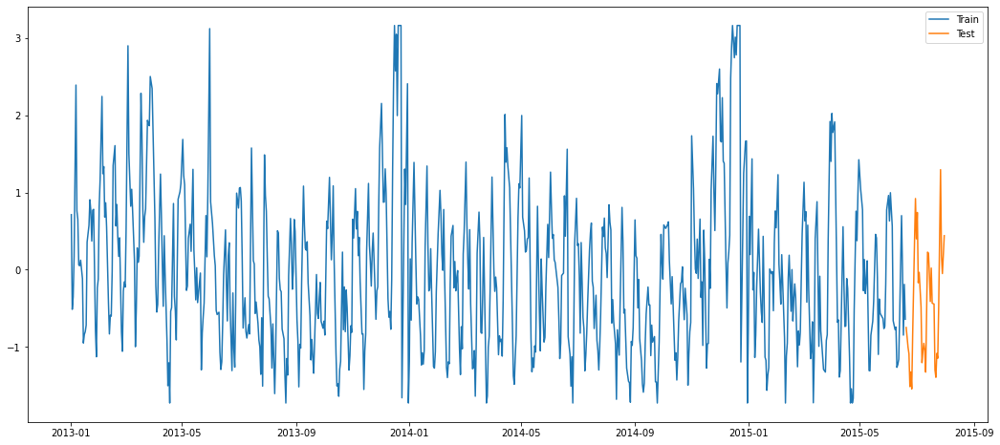

In [ ]:
# plt.figure(figsize=(12,6)) 
plt.plot( trainTestData[1]['train']['Sales'], label='Train')
plt.plot(trainTestData[1]['test']['Sales'], label='Test')
# plt.plot(trainTestData[1]['predictions']['Sales'], label='VAR')
plt.legend(loc='best')
# plt.title('VAR Model - Sales')
plt.show()

In [ ]:

# mod = sm.tsa.VARMAX(trainTestData[25]['train'][['Sales','Customers']], order=(1,1), trend='n')

# res = mod.fit(maxiter=1000, disp=False)
# print(res.summary())
# #Note the AIC value - lower AIC => better model

In [ ]:
# start_index = trainTestData[1]['test'].index.min()
# end_index = trainTestData[1]['test'].index.max()
# predictions = mod.fit().predict(start=start_index, end=end_index)
# trainTestData[1]['predictions']=predictions

# predictions

In [ ]:
# # plt.figure(figsize=(12,6)) 
# plt.plot( trainTestData[1]['train']['Sales'], label='Train')
# plt.plot(trainTestData[1]['test']['Sales'], label='Test')
# plt.plot(trainTestData[1]['predictions']['Sales'], label='VAR')
# plt.legend(loc='best')
# plt.title('VAR Model - Sales')
# plt.show()

In [ ]:
#checking if there is uniqueness in SchoolHoliday and StateHoliday
for store in StoreData:
  uniqueStateHoliday=StoreData[store]['StateHoliday'].unique()
  uniqueSchoolHoliday=StoreData[store]['SchoolHoliday'].unique()
  print('unique StateHoliday Values for Store',store,": ",len(uniqueStateHoliday))
  print('unique SchoolHoliday Values for Store ',store,': ',len(uniqueSchoolHoliday))
  print('\n')

unique StateHoliday Values for Store 1 :  1
unique SchoolHoliday Values for Store  1 :  2


unique StateHoliday Values for Store 3 :  1
unique SchoolHoliday Values for Store  3 :  2


unique StateHoliday Values for Store 8 :  1
unique SchoolHoliday Values for Store  8 :  2


unique StateHoliday Values for Store 9 :  1
unique SchoolHoliday Values for Store  9 :  2


unique StateHoliday Values for Store 13 :  1
unique SchoolHoliday Values for Store  13 :  2


unique StateHoliday Values for Store 25 :  1
unique SchoolHoliday Values for Store  25 :  2


unique StateHoliday Values for Store 29 :  1
unique SchoolHoliday Values for Store  29 :  2


unique StateHoliday Values for Store 31 :  1
unique SchoolHoliday Values for Store  31 :  2


unique StateHoliday Values for Store 46 :  1
unique SchoolHoliday Values for Store  46 :  2




##### From above its clear that for all store, StateHoliday has only 1 value hence we will use only SchoolHoliday for predication

In [ ]:

def PlotAcfPacf(data,store):
  print('\033[1m PACF AND ACF for Store:', store, '\033[0m')
  lag_acf = acf(data['Sales'], nlags=30) # MA 
  lag_pacf = pacf(data['Sales'], nlags=30, method='ols')  # AR 
  plt.subplots(figsize=(20,5))
  #Plot PACF
  # plt.subplot(len(StoreData),2,1)
  plt.subplot(1,2,1)
  plt.plot(lag_pacf)
  plt.axhline(y=0, linestyle='--', color='gray')
  plt.axhline(y=-1.96/np.sqrt(len(data['Sales'])), linestyle='--', color='gray')
  plt.axhline(y=1.96/np.sqrt(len(data['Sales'])), linestyle='--', color='gray')
  plt.title('Partial Autocorrelation Function')
  
  #Plot ACF:
  # plt.subplot(len(StoreData),2,2)
  plt.subplot(1,2,2)
  plt.plot(lag_acf)
  plt.axhline(y=0, linestyle='--', color='gray')
  plt.axhline(y=-1.96/np.sqrt(len(data['Sales'])), linestyle='--', color='gray')
  plt.axhline(y=1.96/np.sqrt(len(data['Sales'])), linestyle='--', color='gray')
  plt.title('Autocorrelation Function')          
  # plt.tight_layout()            
  # print('\n')


In [ ]:
def varMaxModel(data,p,q,exog,hasTrend='n',printStats=False):
 #comment later
  # p,q=1,0
  exog =data['train'][exog]
  mod = sm.tsa.VARMAX(data['train'][['Sales','Customers']], order=(p,q), trend=hasTrend, exog=exog)
  res = mod.fit(maxiter=1000, disp=False)
  if(printStats):
    print(res.summary())
  return mod,res

In [ ]:
def predictVarMax(data,store,mod,res,exog):
  start_index = data['test'].index.min()
  end_index = data['test'].index.max()
  exog=data['test'][exog]

  predictions = res.predict(start=start_index, end=end_index, exog=exog)
  # trainTestData[store]['predictions']=predictions[:-1]
  trainTestData[store]['predictions']=predictions

  



In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
def sarimaxModel(data,exog,p=1,q=1,hasTrend='n',printStats=False):
  #keeping p,q due to resource and time constraints
  p,q=1,1
  if(runSarima):
    exog =data['train'][exog]
    mod = SARIMAX(data['train']['Sales'], order=(p, 1, q), seasonal_order=(1, 1, 1,7),exog=exog,trend=hasTrend) 
    # mod = SARIMAX(data['train']['Sales'], order=(p, 0, q), seasonal_order=(1, 0, 1,30),exog=exog,trend=hasTrend) 

    res = mod.fit()
    if(printStats):
      print(res.params)
    return mod,res

In [ ]:
def predictSariMax(data,store,mod,res,exogV):
  if(runSarima):
    # print(exog)
    start_index = data['test'].index.min()
    end_index = data['test'].index.max()

    predictions = res.predict(start_index, end_index,exog=data['test'][exogV])
    
    trainTestData[store]['predictions']=predictions.to_frame(name='Sales')

In [ ]:
def inverseTransform(data_frame,store):
  trainTestData[store]['train'][multivariateCol]=scalers[store].inverse_transform(data_frame['train'][multivariateCol])
  trainTestData[store]['test'][multivariateCol]=scalers[store].inverse_transform(data_frame['test'][multivariateCol])
  trainTestData[store]['predictions'][multivariateCol]=scalers[store].inverse_transform(data_frame['predictions'][multivariateCol])


  # trainTestData[store]['train'][multivariateCol]=scaler.inverse_transform(data_frame['train'][multivariateCol])
  # trainTestData[store]['test'][multivariateCol]=scaler.inverse_transform(data_frame['test'][multivariateCol])
  # trainTestData[store]['predictions'][multivariateCol]=scaler.inverse_transform(data_frame['predictions'][multivariateCol])
  # return data_frame

In [ ]:
def plotPrediction(data,store,res,model_name='VarMax'):
  plt.figure(figsize=(20,8)) 
  plt.plot(data['train']['Sales'], label='Train')
  plt.plot(data['test']['Sales'], label='Test')
  plt.plot(data['predictions']['Sales'], label='VAR')
  plt.legend(loc='best')
  plt.title(model_name+' Model - Sales '+ str(store))
  plt.show()
  if(model_name=='VarMax'):
    ax = res.impulse_responses(steps=25, orthogonalized=False).plot(figsize=(10,5))
    ax.set(xlabel='t', title='Responses to a shock to `Sales');
    plt.show()

In [ ]:
modelPerformance = pd.DataFrame(columns = ['Method', 'RMSE', 'MAPE'])

def getModelMetrics(data,store,model_name='VarMax'):
  global modelPerformance
  rmse = np.sqrt(mean_squared_error(data['test']['Sales'], data['predictions']['Sales'])).round(2)
  mape = np.round(np.mean(np.abs(data['test']['Sales']-data['predictions']['Sales'])/data['test']['Sales'])*100,2)

  tempResults = pd.DataFrame({'Method':[str(model_name) +' for Store '+ str(store)], 'RMSE': [rmse],'MAPE': [mape] })
  # results = results[['Method', 'RMSE', 'MAPE']]
  modelPerformance=modelPerformance.append(tempResults)
  return modelPerformance

  # results

After lot of playing around below set of exogenous variable produce lowest AIC for many stores

In [ ]:
exogvariables=['Promo','SchoolHoliday','DayOfWeek','Day']
exogvariables.extend(promo2col)
exogvariables

['Promo',
 'SchoolHoliday',
 'DayOfWeek',
 'Day',
 'PromoInterval_0',
 'PromoInterval_Apr',
 'PromoInterval_Aug',
 'PromoInterval_Feb',
 'PromoInterval_Jan',
 'PromoInterval_Jul',
 'PromoInterval_May',
 'PromoInterval_Nov',
 'PromoInterval_Oct']

In [ ]:
# mod,res=varMaxModel(trainTestData[1],p=1,q=1,exog=exogvariables,printStats=True)

In [ ]:
# predictVarMax(trainTestData[1],1,mod,res=res,exog=exogvariables)

In [ ]:
# plotPrediction(trainTestData[1],1,res)

Lets Now build model for each store. We will select p,q based on PACF & ACF graphs

 PACF AND ACF for Store: 1 


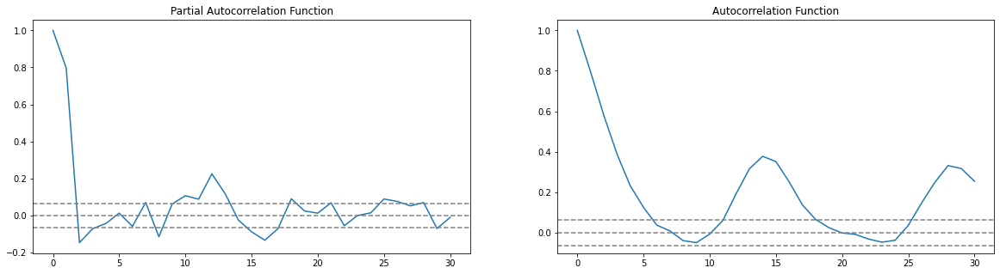

In [ ]:
PlotAcfPacf(StoreData[1],1)

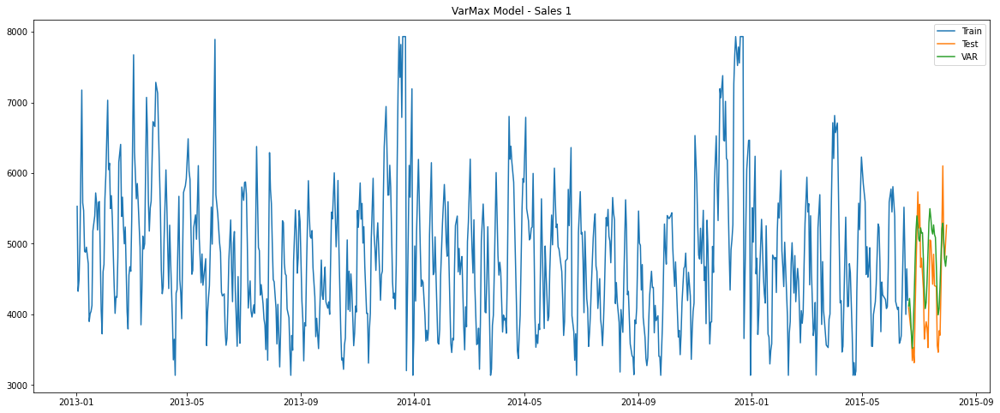

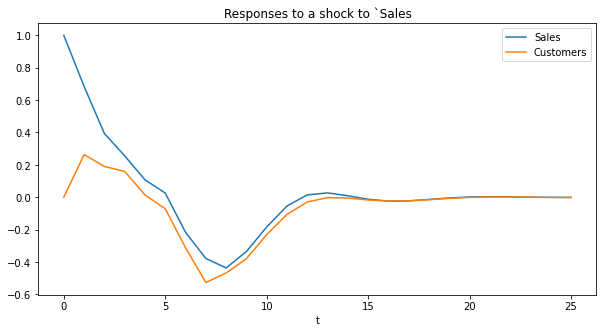

In [ ]:
#Choose p,q base on where the curve touches y=0 for first time

mod,res=varMaxModel(trainTestData[1],p=2,q=7,exog=exogvariables)
predictVarMax(trainTestData[1],1,mod,res,exog=exogvariables)
inverseTransform(trainTestData[1],1)
plotPrediction(trainTestData[1],1,res)

In [ ]:
getModelMetrics(trainTestData[1],1)
# trainTestData[1]['test']

,Method,RMSE,MAPE
0,VarMax for Store 1,535.74,10.72


In [ ]:
#sarima
mod,res=sarimaxModel(trainTestData[1],exog=exogvariables,p=2,q=7)


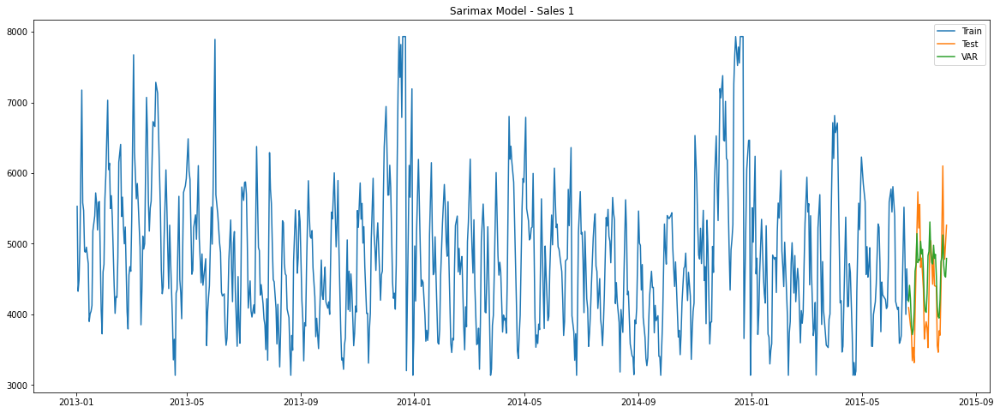

In [ ]:
predictSariMax(trainTestData[1],1,mod,res,exogV=exogvariables)
plotPrediction(trainTestData[1],1,res,'Sarimax')

In [ ]:
getModelMetrics(trainTestData[1],1,'Sarimax')

,Method,RMSE,MAPE
0,VarMax for Store 1,535.74,10.72
0,Sarimax for Store 1,477.62,9.20


 PACF AND ACF for Store: 3 


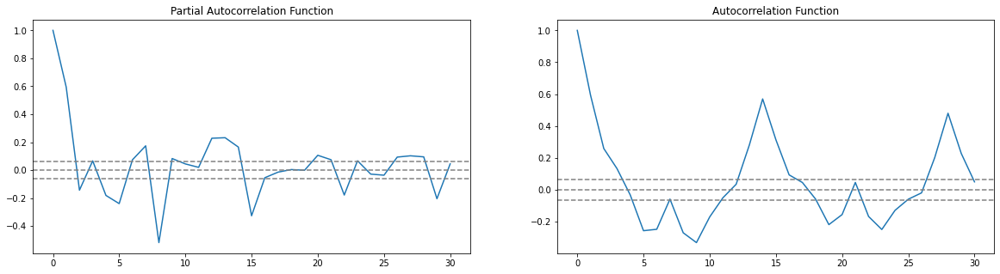

In [ ]:
#store 3
PlotAcfPacf(StoreData[3],3)

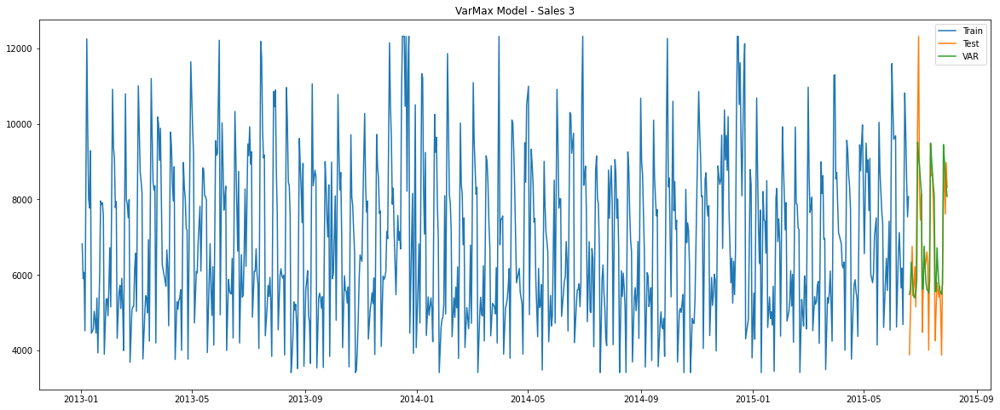

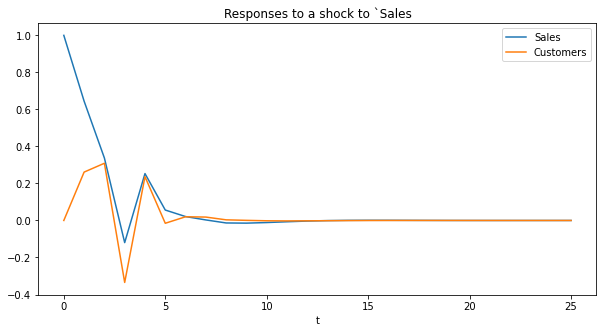

In [ ]:
#Choose p,q base on where the curve touches y=0 for first time
mod,res=varMaxModel(trainTestData[3],p=2,q=4,exog=exogvariables)

predictVarMax(trainTestData[3],store=3,mod=mod,res=res,exog=exogvariables)
inverseTransform(trainTestData[3],3)
plotPrediction(trainTestData[3],3,res)

In [ ]:
getModelMetrics(trainTestData[3],3)

,Method,RMSE,MAPE
0,VarMax for Store 1,535.74,10.72
0,Sarimax for Store 1,477.62,9.20
0,VarMax for Store 3,964.06,12.05


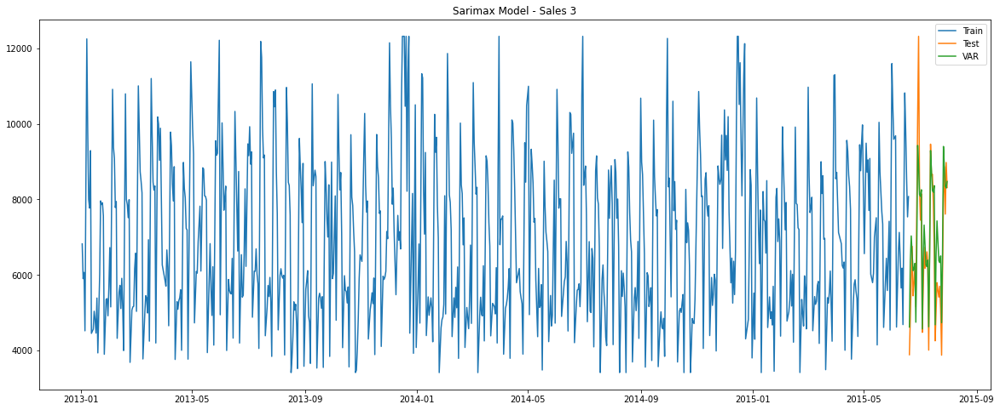

In [ ]:
mod,res=sarimaxModel(trainTestData[3],exog=exogvariables,p=2,q=4)
predictSariMax(trainTestData[3],3,mod,res,exogV=exogvariables)
plotPrediction(trainTestData[3],3,res,'Sarimax')


In [ ]:
getModelMetrics(trainTestData[3],3,'Sarimax')

,Method,RMSE,MAPE
0,VarMax for Store 1,535.74,10.72
0,Sarimax for Store 1,477.62,9.20
0,VarMax for Store 3,964.06,12.05
0,Sarimax for Store 3,952.68,11.38


 PACF AND ACF for Store: 8 


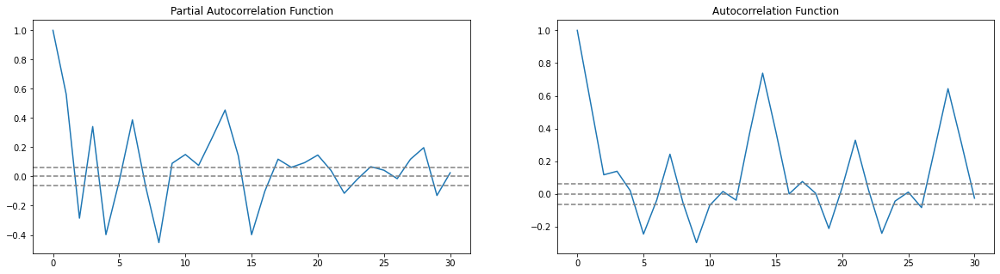

In [ ]:
#store 8
PlotAcfPacf(StoreData[8],8)

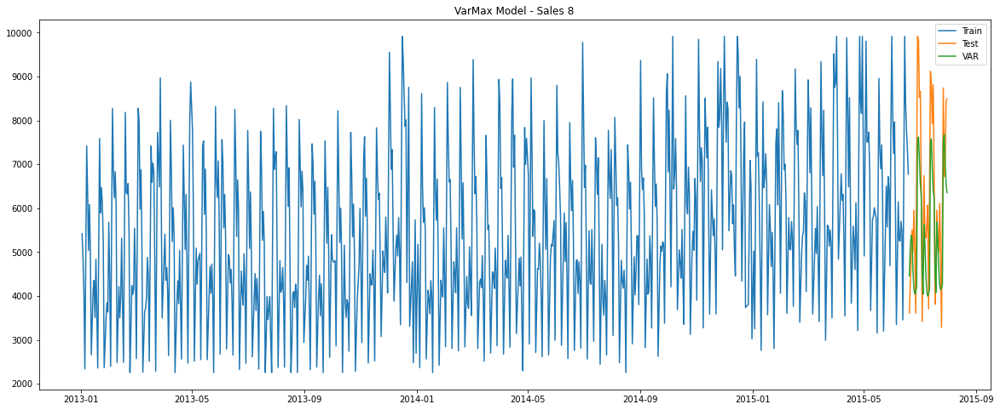

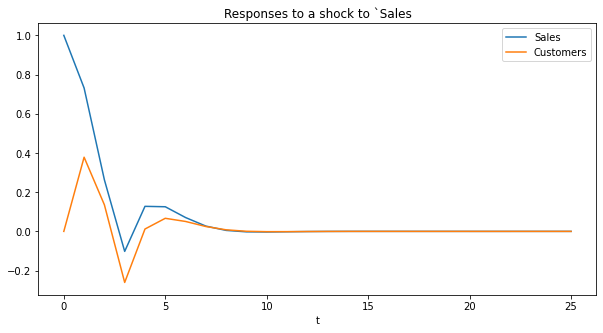

In [ ]:
#Choose p,q base on where the curve touches y=0 for first time
mod,res=varMaxModel(trainTestData[8],p=1,q=4,exog=exogvariables)
predictVarMax(trainTestData[8],store=8,mod=mod,res=res,exog=exogvariables)
inverseTransform(trainTestData[8],8)
plotPrediction(trainTestData[8],8,res)

In [ ]:
getModelMetrics(trainTestData[8],8)

,Method,RMSE,MAPE
0,VarMax for Store 1,535.74,10.72
0,Sarimax for Store 1,477.62,9.20
0,VarMax for Store 3,964.06,12.05
0,Sarimax for Store 3,952.68,11.38
0,VarMax for Store 8,"1,367.08",18.23


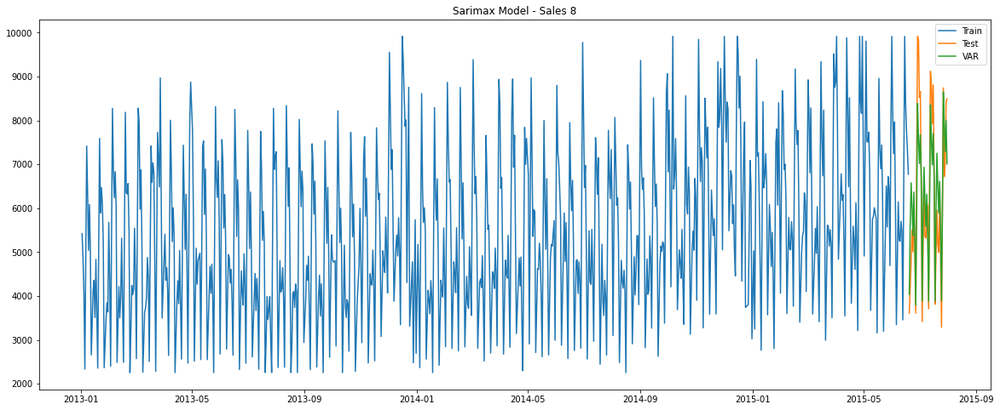

In [ ]:
mod,res=sarimaxModel(trainTestData[8],exog=exogvariables,p=1,q=4)
predictSariMax(trainTestData[8],8,mod,res,exogV=exogvariables)
plotPrediction(trainTestData[8],8,res,'Sarimax')


In [ ]:
getModelMetrics(trainTestData[8],8,'Sarimax')

,Method,RMSE,MAPE
0,VarMax for Store 1,535.74,10.72
0,Sarimax for Store 1,477.62,9.20
0,VarMax for Store 3,964.06,12.05
0,Sarimax for Store 3,952.68,11.38
0,VarMax for Store 8,"1,367.08",18.23
0,Sarimax for Store 8,919.91,12.28


 PACF AND ACF for Store: 9 


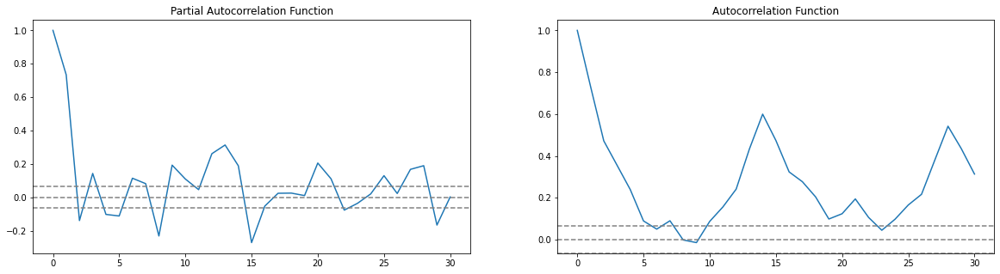

In [ ]:
#store 9
PlotAcfPacf(StoreData[9],9)

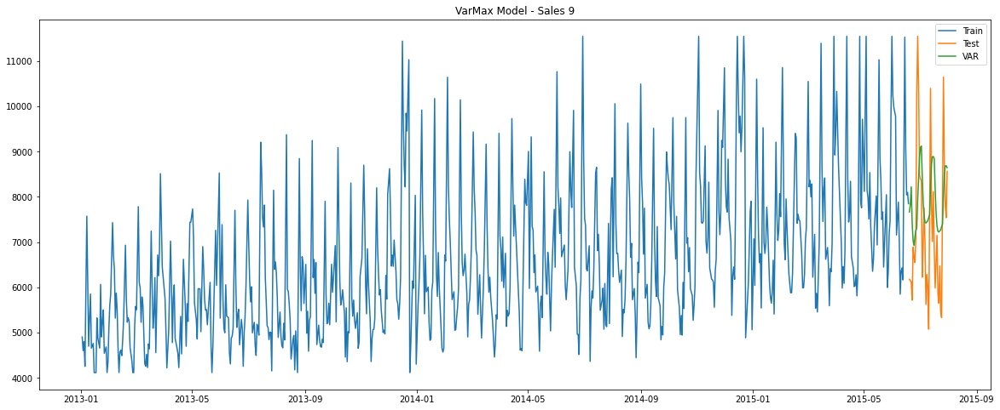

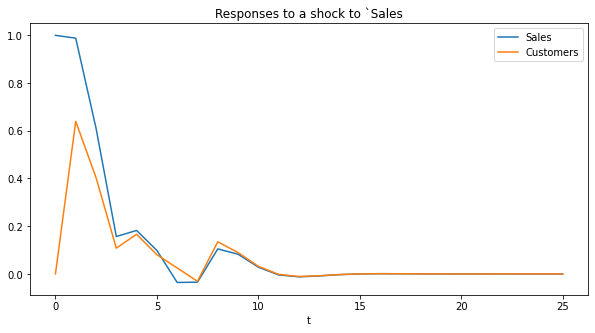

In [ ]:
#Choose p,q base on where the curve touches y=0 for first time. Also passing trend
mod,res=varMaxModel(trainTestData[9],p=2,q=8,exog=exogvariables,hasTrend='t')
predictVarMax(trainTestData[9],store=9,mod=mod,res=res,exog=exogvariables)
inverseTransform(trainTestData[9],store=9)
plotPrediction(trainTestData[9],9,res)

In [ ]:
getModelMetrics(trainTestData[9],store=9)

,Method,RMSE,MAPE
0,VarMax for Store 1,535.74,10.72
0,Sarimax for Store 1,477.62,9.20
0,VarMax for Store 3,964.06,12.05
0,Sarimax for Store 3,952.68,11.38
0,VarMax for Store 8,"1,367.08",18.23
0,Sarimax for Store 8,919.91,12.28
0,VarMax for Store 9,"1,542.87",18.28


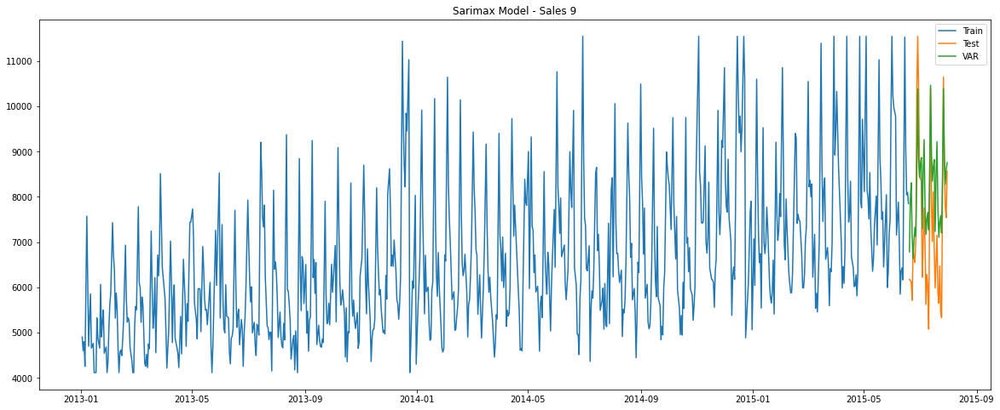

In [ ]:
mod,res=sarimaxModel(trainTestData[9],exog=exogvariables,p=2,q=8,hasTrend='t')
predictSariMax(trainTestData[9],9,mod,res,exogV=exogvariables)
plotPrediction(trainTestData[9],9,res,'Sarimax')


In [ ]:
getModelMetrics(trainTestData[9],9,'Sarimax')

,Method,RMSE,MAPE
0,VarMax for Store 1,535.74,10.72
0,Sarimax for Store 1,477.62,9.20
0,VarMax for Store 3,964.06,12.05
0,Sarimax for Store 3,952.68,11.38
0,VarMax for Store 8,"1,367.08",18.23
0,Sarimax for Store 8,919.91,12.28
0,VarMax for Store 9,"1,542.87",18.28
0,Sarimax for Store 9,"1,298.49",16.78


 PACF AND ACF for Store: 13 


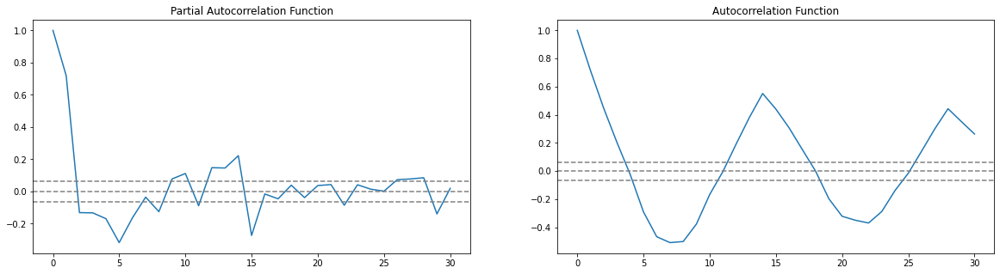

In [ ]:
#store 13
storeNo=13
PlotAcfPacf(StoreData[storeNo],storeNo)

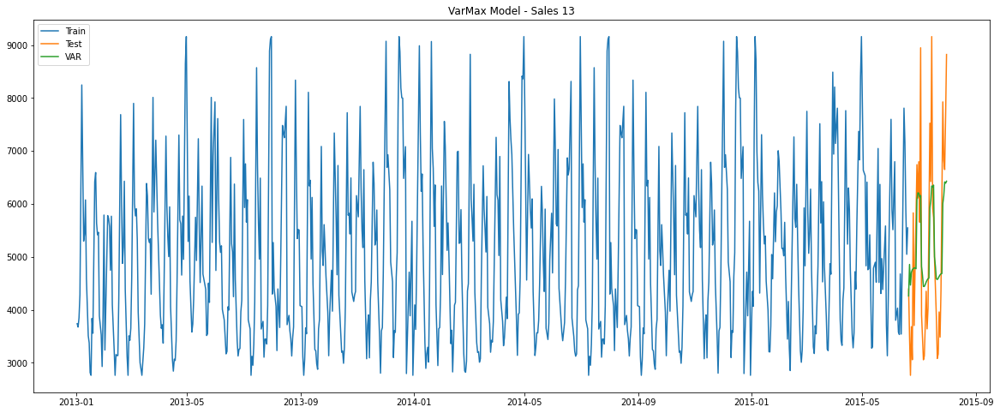

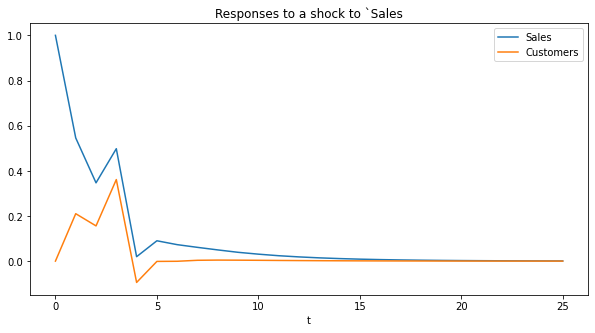

In [ ]:
#Choose p,q base on where the curve touches y=0 for first time
mod,res=varMaxModel(trainTestData[storeNo],p=2,q=4,exog=exogvariables)
predictVarMax(trainTestData[storeNo],store=storeNo,mod=mod,res=res,exog=exogvariables)
inverseTransform(trainTestData[storeNo],store=storeNo)
plotPrediction(trainTestData[storeNo],storeNo,res)

In [ ]:
getModelMetrics(trainTestData[storeNo],store=storeNo)

,Method,RMSE,MAPE
0,VarMax for Store 1,535.74,10.72
0,Sarimax for Store 1,477.62,9.20
0,VarMax for Store 3,964.06,12.05
0,Sarimax for Store 3,952.68,11.38
0,VarMax for Store 8,"1,367.08",18.23
0,Sarimax for Store 8,919.91,12.28
0,VarMax for Store 9,"1,542.87",18.28
0,Sarimax for Store 9,"1,298.49",16.78
0,VarMax for Store 13,"1,210.22",21.44


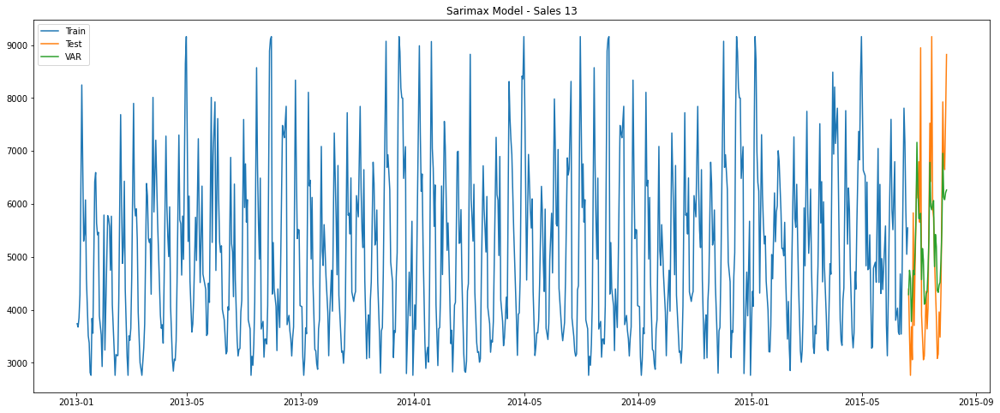

In [ ]:
mod,res=sarimaxModel(trainTestData[storeNo],exog=exogvariables,p=2,q=4)
predictSariMax(trainTestData[storeNo],storeNo,mod,res,exogV=exogvariables)
plotPrediction(trainTestData[storeNo],storeNo,res,'Sarimax')


In [ ]:
getModelMetrics(trainTestData[storeNo],storeNo,'Sarimax')

,Method,RMSE,MAPE
0,VarMax for Store 1,535.74,10.72
0,Sarimax for Store 1,477.62,9.20
0,VarMax for Store 3,964.06,12.05
0,Sarimax for Store 3,952.68,11.38
0,VarMax for Store 8,"1,367.08",18.23
0,Sarimax for Store 8,919.91,12.28
0,VarMax for Store 9,"1,542.87",18.28
0,Sarimax for Store 9,"1,298.49",16.78
0,VarMax for Store 13,"1,210.22",21.44
0,Sarimax for Store 13,"1,179.97",19.39


 PACF AND ACF for Store: 25 


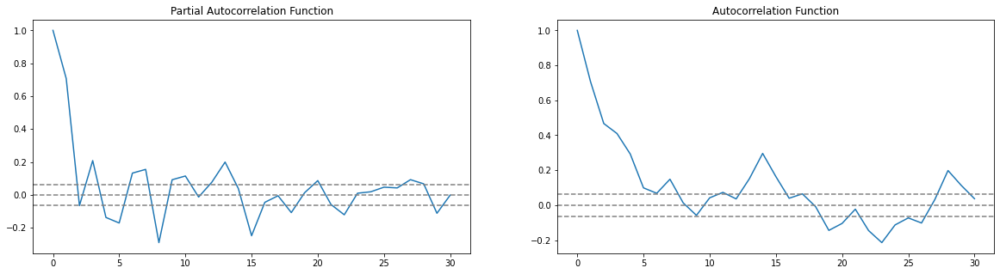

In [ ]:
#store 25
storeNo=25
PlotAcfPacf(StoreData[storeNo],storeNo)

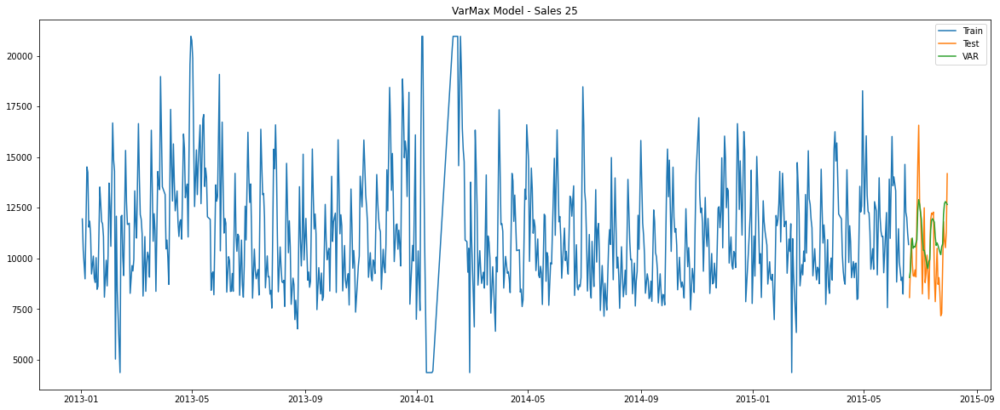

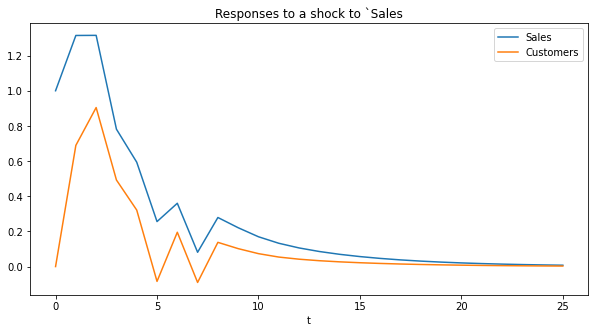

In [ ]:
#Choose p,q base on where the curve touches y=0 for first time
mod,res=varMaxModel(trainTestData[storeNo],p=2,q=8,exog=exogvariables)
predictVarMax(trainTestData[storeNo],store=storeNo,mod=mod,res=res,exog=exogvariables)
inverseTransform(trainTestData[storeNo],store=storeNo)
plotPrediction(trainTestData[storeNo],storeNo,res)

In [ ]:
getModelMetrics(trainTestData[storeNo],store=storeNo)

,Method,RMSE,MAPE
0,VarMax for Store 1,535.74,10.72
0,Sarimax for Store 1,477.62,9.20
0,VarMax for Store 3,964.06,12.05
0,Sarimax for Store 3,952.68,11.38
0,VarMax for Store 8,"1,367.08",18.23
0,Sarimax for Store 8,919.91,12.28
0,VarMax for Store 9,"1,542.87",18.28
0,Sarimax for Store 9,"1,298.49",16.78
0,VarMax for Store 13,"1,210.22",21.44
0,Sarimax for Store 13,"1,179.97",19.39


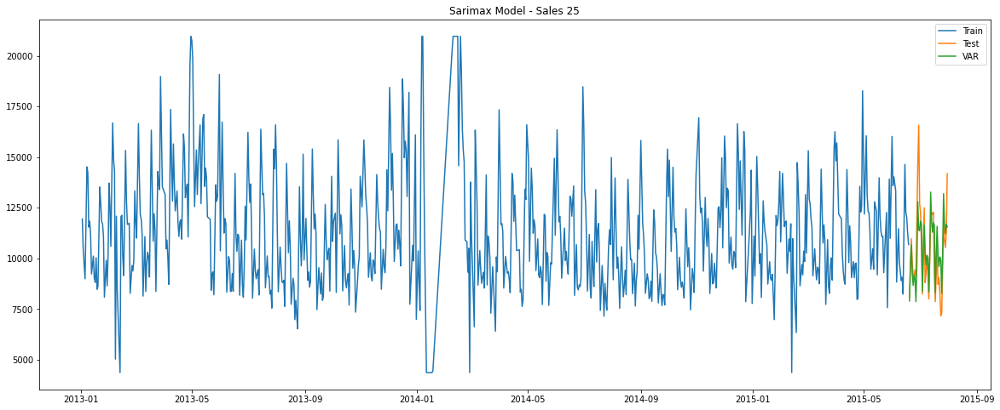

In [ ]:
mod,res=sarimaxModel(trainTestData[storeNo],exog=exogvariables,p=2,q=8)
predictSariMax(trainTestData[storeNo],storeNo,mod,res,exogV=exogvariables)
plotPrediction(trainTestData[storeNo],storeNo,res,'Sarimax')


In [ ]:
getModelMetrics(trainTestData[storeNo],storeNo,'Sarimax')

,Method,RMSE,MAPE
0,VarMax for Store 1,535.74,10.72
0,Sarimax for Store 1,477.62,9.20
0,VarMax for Store 3,964.06,12.05
0,Sarimax for Store 3,952.68,11.38
0,VarMax for Store 8,"1,367.08",18.23
0,Sarimax for Store 8,919.91,12.28
0,VarMax for Store 9,"1,542.87",18.28
0,Sarimax for Store 9,"1,298.49",16.78
0,VarMax for Store 13,"1,210.22",21.44
0,Sarimax for Store 13,"1,179.97",19.39


 PACF AND ACF for Store: 29 


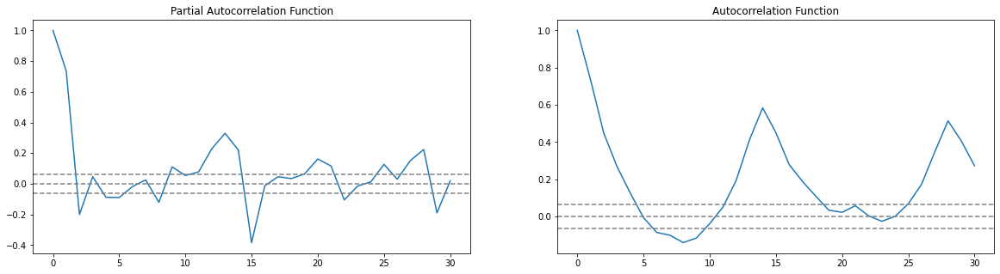

In [ ]:
#store 29
storeNo=29
PlotAcfPacf(StoreData[storeNo],storeNo)

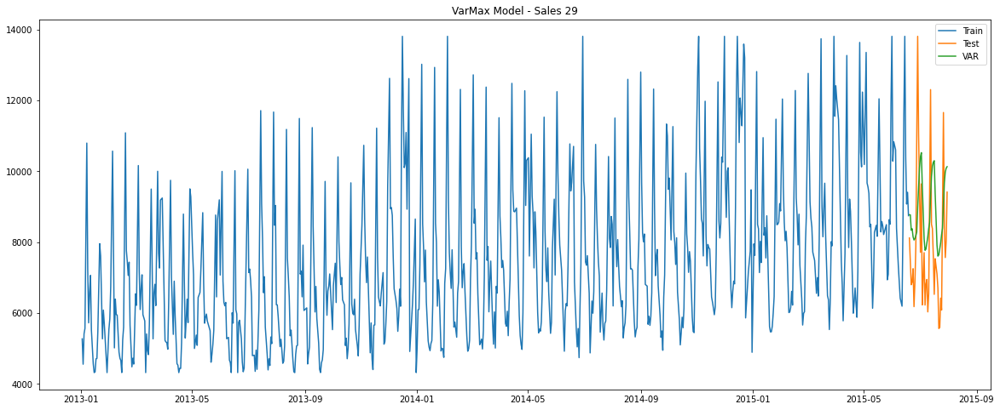

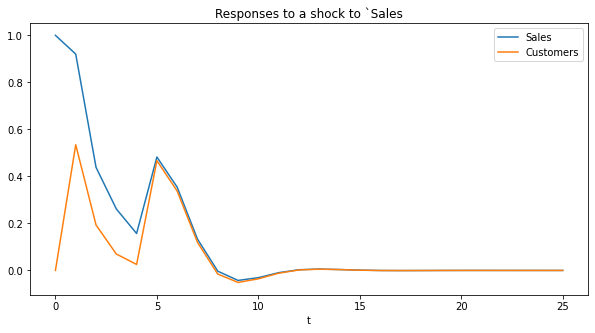

In [ ]:
#Choose p,q base on where the curve touches y=0 for first time. Also passing trend
mod,res=varMaxModel(trainTestData[storeNo],p=2,q=5,exog=exogvariables,hasTrend='t')
predictVarMax(trainTestData[storeNo],store=storeNo,mod=mod,res=res,exog=exogvariables)
inverseTransform(trainTestData[storeNo],store=storeNo)
plotPrediction(trainTestData[storeNo],storeNo,res)

In [ ]:
getModelMetrics(trainTestData[storeNo],store=storeNo)

,Method,RMSE,MAPE
0,VarMax for Store 1,535.74,10.72
0,Sarimax for Store 1,477.62,9.20
0,VarMax for Store 3,964.06,12.05
0,Sarimax for Store 3,952.68,11.38
0,VarMax for Store 8,"1,367.08",18.23
0,Sarimax for Store 8,919.91,12.28
0,VarMax for Store 9,"1,542.87",18.28
0,Sarimax for Store 9,"1,298.49",16.78
0,VarMax for Store 13,"1,210.22",21.44
0,Sarimax for Store 13,"1,179.97",19.39


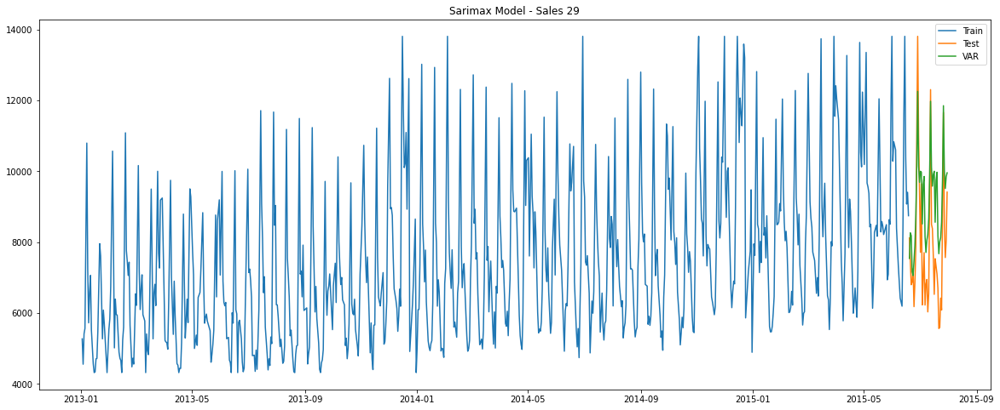

In [ ]:
mod,res=sarimaxModel(trainTestData[storeNo],exog=exogvariables,p=2,q=5,hasTrend='t')
predictSariMax(trainTestData[storeNo],storeNo,mod,res,exogV=exogvariables)
plotPrediction(trainTestData[storeNo],storeNo,res,'Sarimax')


In [ ]:
getModelMetrics(trainTestData[storeNo],storeNo,'Sarimax')

,Method,RMSE,MAPE
0,VarMax for Store 1,535.74,10.72
0,Sarimax for Store 1,477.62,9.20
0,VarMax for Store 3,964.06,12.05
0,Sarimax for Store 3,952.68,11.38
0,VarMax for Store 8,"1,367.08",18.23
0,Sarimax for Store 8,919.91,12.28
0,VarMax for Store 9,"1,542.87",18.28
0,Sarimax for Store 9,"1,298.49",16.78
0,VarMax for Store 13,"1,210.22",21.44
0,Sarimax for Store 13,"1,179.97",19.39


 PACF AND ACF for Store: 31 


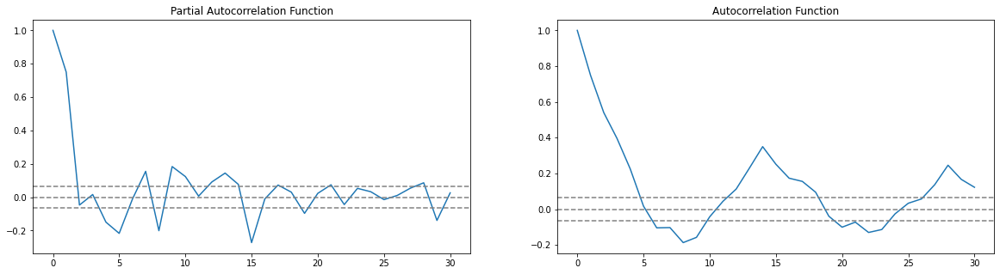

In [ ]:
#store 31
storeNo=31
PlotAcfPacf(StoreData[storeNo],storeNo)

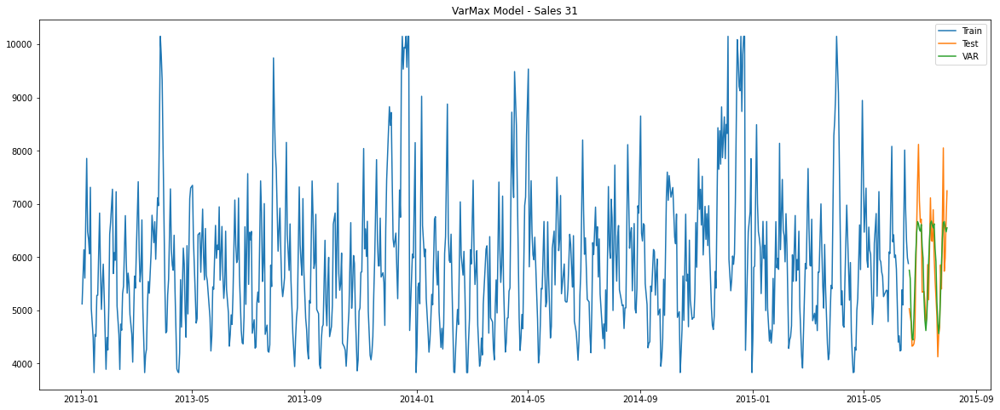

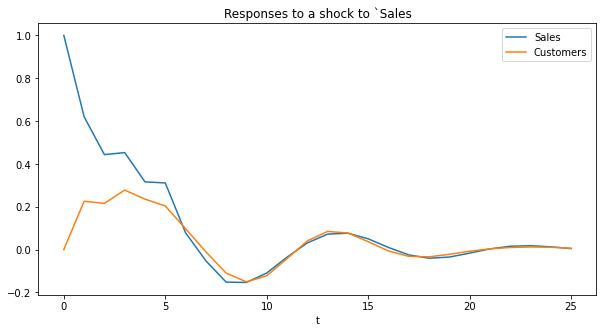

In [ ]:
#Choose p,q base on where the curve touches y=0 for first time
mod,res=varMaxModel(trainTestData[storeNo],p=3,q=5,exog=exogvariables)
predictVarMax(trainTestData[storeNo],store=storeNo,mod=mod,res=res,exog=exogvariables)
inverseTransform(trainTestData[storeNo],store=storeNo)
plotPrediction(trainTestData[storeNo],storeNo,res)

In [ ]:
getModelMetrics(trainTestData[storeNo],store=storeNo)

,Method,RMSE,MAPE
0,VarMax for Store 1,535.74,10.72
0,Sarimax for Store 1,477.62,9.20
0,VarMax for Store 3,964.06,12.05
0,Sarimax for Store 3,952.68,11.38
0,VarMax for Store 8,"1,367.08",18.23
0,Sarimax for Store 8,919.91,12.28
0,VarMax for Store 9,"1,542.87",18.28
0,Sarimax for Store 9,"1,298.49",16.78
0,VarMax for Store 13,"1,210.22",21.44
0,Sarimax for Store 13,"1,179.97",19.39


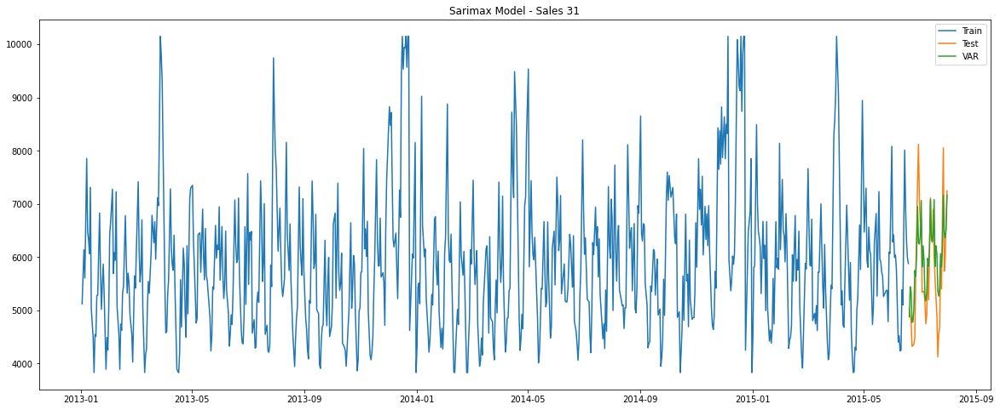

In [ ]:
mod,res=sarimaxModel(trainTestData[storeNo],exog=exogvariables,p=3,q=5)
predictSariMax(trainTestData[storeNo],storeNo,mod,res,exogV=exogvariables)
plotPrediction(trainTestData[storeNo],storeNo,res,'Sarimax')


In [ ]:
getModelMetrics(trainTestData[storeNo],storeNo,'Sarimax')

,Method,RMSE,MAPE
0,VarMax for Store 1,535.74,10.72
0,Sarimax for Store 1,477.62,9.20
0,VarMax for Store 3,964.06,12.05
0,Sarimax for Store 3,952.68,11.38
0,VarMax for Store 8,"1,367.08",18.23
0,Sarimax for Store 8,919.91,12.28
0,VarMax for Store 9,"1,542.87",18.28
0,Sarimax for Store 9,"1,298.49",16.78
0,VarMax for Store 13,"1,210.22",21.44
0,Sarimax for Store 13,"1,179.97",19.39


 PACF AND ACF for Store: 46 


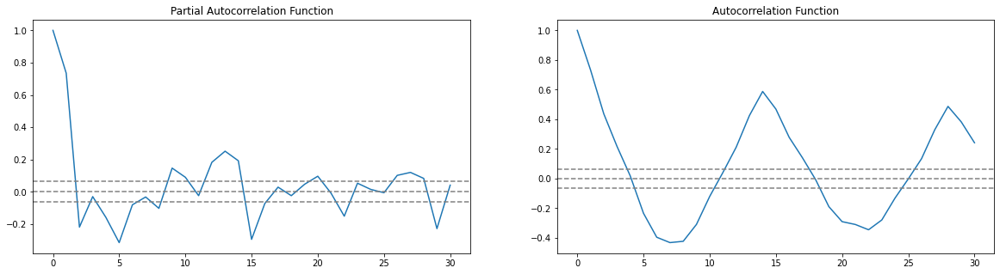

In [ ]:
#store 46
storeNo=46
PlotAcfPacf(StoreData[storeNo],storeNo)

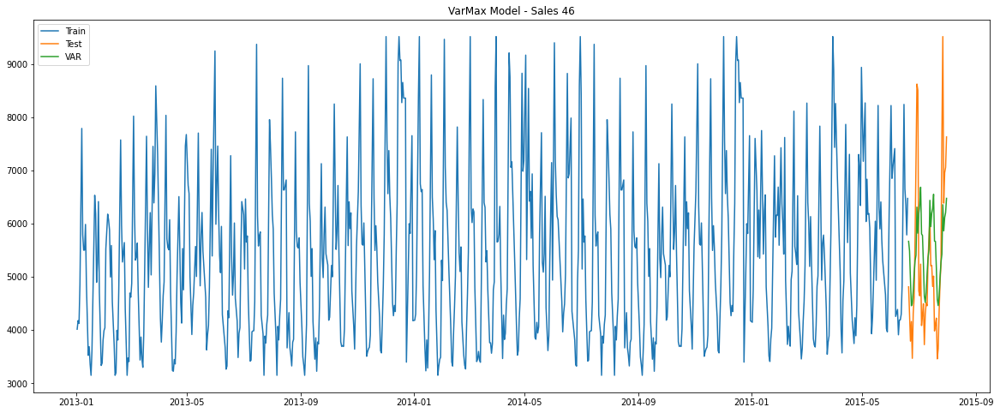

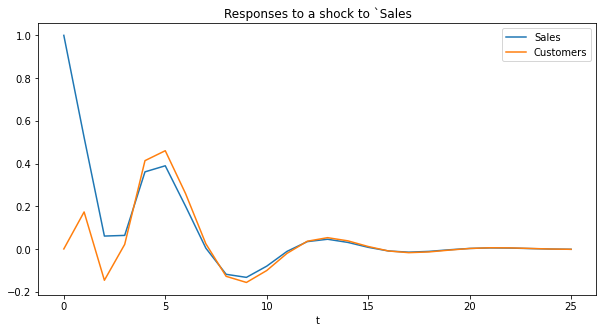

In [ ]:
#Choose p,q base on where the curve touches y=0 for first time
mod,res=varMaxModel(trainTestData[storeNo],p=2,q=4,exog=exogvariables)
predictVarMax(trainTestData[storeNo],store=storeNo,mod=mod,res=res,exog=exogvariables)
inverseTransform(trainTestData[storeNo],store=storeNo)
plotPrediction(trainTestData[storeNo],storeNo,res)

In [ ]:
getModelMetrics(trainTestData[storeNo],store=storeNo)

,Method,RMSE,MAPE
0,VarMax for Store 1,535.74,10.72
0,Sarimax for Store 1,477.62,9.20
0,VarMax for Store 3,964.06,12.05
0,Sarimax for Store 3,952.68,11.38
0,VarMax for Store 8,"1,367.08",18.23
0,Sarimax for Store 8,919.91,12.28
0,VarMax for Store 9,"1,542.87",18.28
0,Sarimax for Store 9,"1,298.49",16.78
0,VarMax for Store 13,"1,210.22",21.44
0,Sarimax for Store 13,"1,179.97",19.39


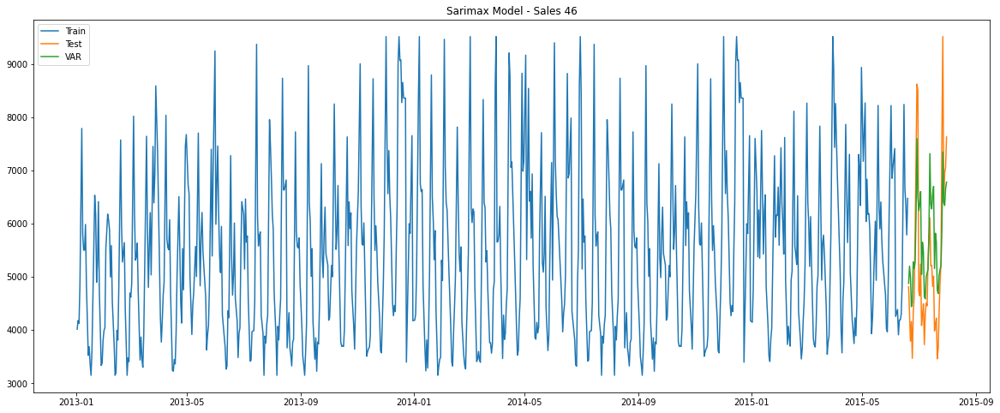

In [ ]:
mod,res=sarimaxModel(trainTestData[storeNo],exog=exogvariables,p=2,q=4)
predictSariMax(trainTestData[storeNo],storeNo,mod,res,exogV=exogvariables)
plotPrediction(trainTestData[storeNo],storeNo,res,'Sarimax')


In [ ]:
getModelMetrics(trainTestData[storeNo],storeNo,'Sarimax')

,Method,RMSE,MAPE
0,VarMax for Store 1,535.74,10.72
0,Sarimax for Store 1,477.62,9.20
0,VarMax for Store 3,964.06,12.05
0,Sarimax for Store 3,952.68,11.38
0,VarMax for Store 8,"1,367.08",18.23
0,Sarimax for Store 8,919.91,12.28
0,VarMax for Store 9,"1,542.87",18.28
0,Sarimax for Store 9,"1,298.49",16.78
0,VarMax for Store 13,"1,210.22",21.44
0,Sarimax for Store 13,"1,179.97",19.39


#### Sarima model seems to capture the seasonality pattern in data more correctly